In [1]:
%load_ext autoreload
%autoreload 3

In [2]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina' # high res plotting

import sys
sys.path.append('/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/spikeparam/spikeparam')
sys.path.append(('/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/'))
sys.path.append(('/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/spikeparam/AP_empirical_paper1/datasets/spe-1/spe1_helper_modules/'))
sys.path.append(('/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/spikeparam/AP_empirical_paper1/datasets/shared_helper_modules'))

# General imports
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm.notebook import tqdm
import warnings
import pickle
import glob


warnings.filterwarnings(
    "ignore",
    message="use_inf_as_na option is deprecated",
    category=FutureWarning,
    module="seaborn")

warnings.filterwarnings(
    "ignore",
    message=r"invalid value encountered in log10",
    category=RuntimeWarning,
    module=r".*specparam.*",
)


# NeuroDSP and FOOOF modules
from neurodsp import spectral

from specparam import Bands


# Custom modules

from spk_feat_cluster_analysis import *

from spe1_plotting import *
from spikeparam.patch.fit import Spike

from config import NPX_CHANNELS, CELL_IDS, DICT_PATCH_FS, DICT_CHAN_PRED, DICT_SPK_THRESH, FILTER_SETTINGS, SPE1_DATA_ROOT, SPE1_PICKLE_ROOT


In [3]:
cell_num = 21 #MODIFY THIS WHEN RUNNING DIFFERENT CELLS 

npx_fs = 30000 # sampling rate
lfp_fs = 3500 # sampling rate

patch_fs = DICT_PATCH_FS[cell_num ]
spk_thresh = DICT_SPK_THRESH[cell_num]

npx_channels = NPX_CHANNELS
npx_patch_channel = DICT_CHAN_PRED[cell_num ]



In [4]:
# Parameters
FORCE_CLUSTER = False


### Loading spe-1 data:

I moved the data loading steps to a separate Jupyter Notebook (spe-1_load_data)




## Cell   
### Analyze Gamma LFP and whole patch clamp AP relationship for cell 

## Step 0: Get loaded data 

In [5]:
lfp_dir = os.path.join(SPE1_DATA_ROOT, 'filt_lfp_recordings', f'c{cell_num}_lfp.npy')
patch_dir = os.path.join(SPE1_DATA_ROOT, 'filt_patch_recordings', f'c{cell_num}_patch.npy')


In [6]:
#get LFP data
lfp_filt = np.load(lfp_dir)
lfp_one_ms = float(lfp_fs / 1000)
lfp_times = np.arange(0, np.shape(lfp_filt)[0]) / lfp_one_ms # in ms instead of sec

#get patch data 
patch_filt = np.load(patch_dir)
patch_one_ms = float(patch_fs  / 1000)
patch_times = np.arange(0, np.shape(patch_filt )[0]) / patch_one_ms # in ms instead of sec

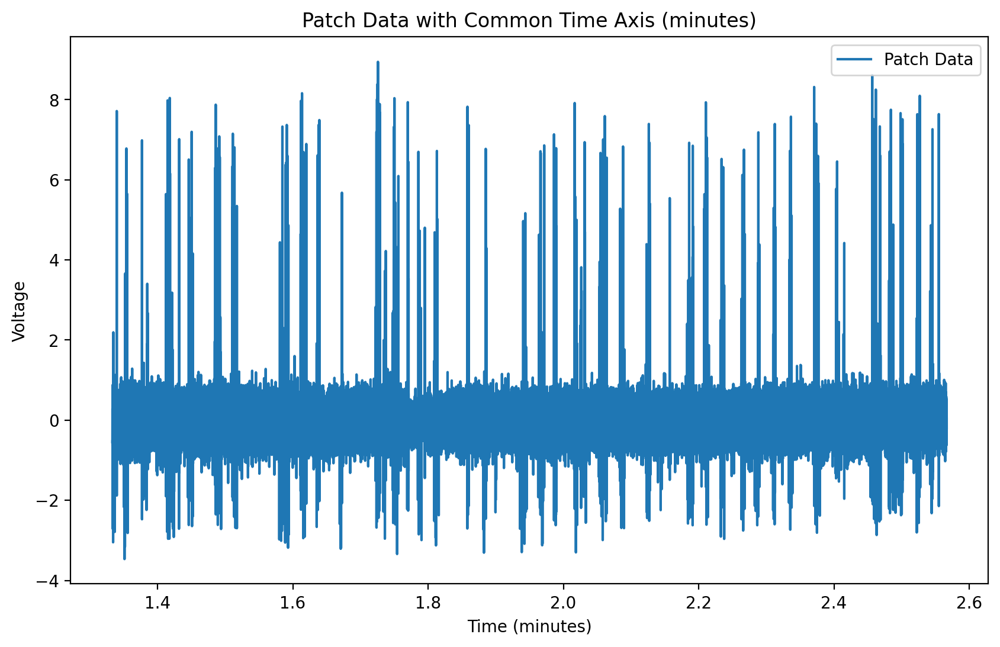

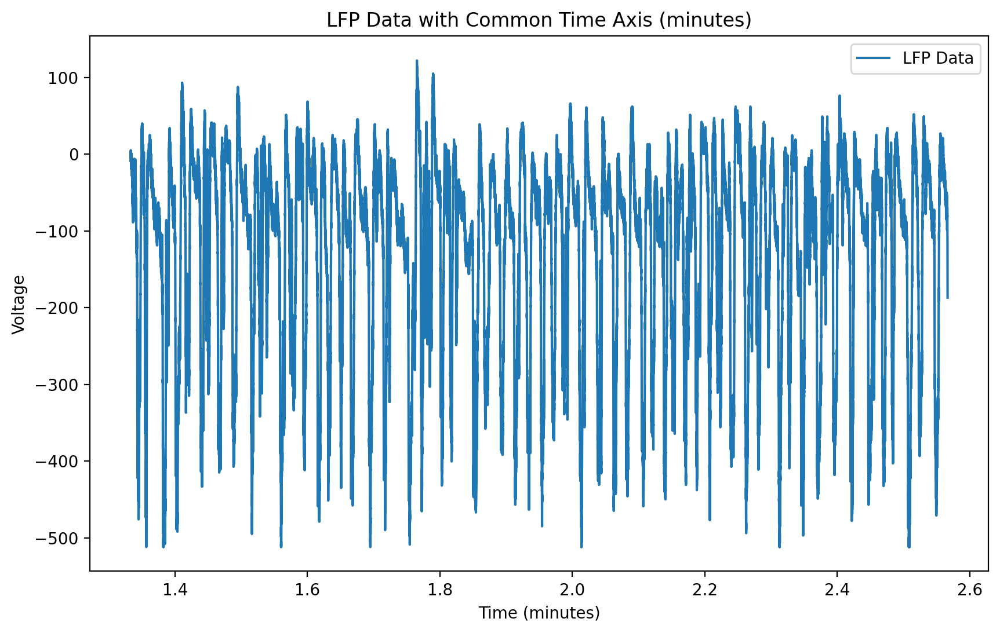

In [7]:
# Plot simultaneous patch and LFP data
# Convert time arrays to minutes
patch_times_min = patch_times / 60000  # Convert milliseconds to minutes
lfp_times_min = lfp_times / 60000  # Convert milliseconds to minutes

# Set the common time axis in minutes (e.g., from 13.3333 to 35.6667 minutes)
common_time_range_min = np.arange(80000 / 60000, 154000 / 60000, 1 / 60000)  # Adjust as needed

# Interpolate patch data onto the common time axis
patch_interp = np.interp(common_time_range_min, patch_times_min, patch_filt)

# Interpolate LFP data onto the common time axis
lfp_interp = np.interp(common_time_range_min, lfp_times_min, lfp_filt)

# Plot patch data with common time axis in minutes
plt.figure(figsize=(10, 6))
plt.plot(common_time_range_min, patch_interp, label='Patch Data')
plt.xlabel('Time (minutes)')
plt.ylabel('Voltage')
plt.title('Patch Data with Common Time Axis (minutes)')
plt.legend()
plt.show()

# Plot LFP data with common time axis in minutes
plt.figure(figsize=(10, 6))
plt.plot(common_time_range_min, lfp_interp, label='LFP Data')
plt.xlabel('Time (minutes)')
plt.ylabel('Voltage')
plt.title('LFP Data with Common Time Axis (minutes)')
plt.legend()
plt.show()

## STEP 1: Detect and fit spikes from patch data

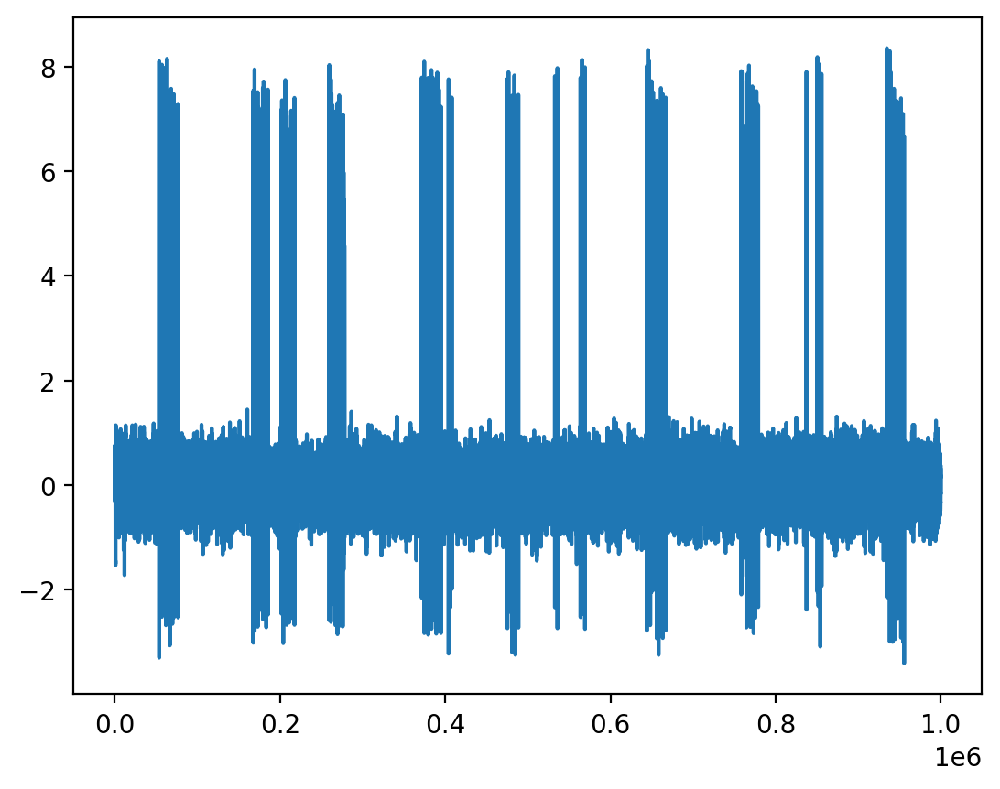

In [8]:
plt.plot(patch_filt[:1000000] )

In [9]:



#threshold in mVs
sp = Spike(thresh_amp=4, window_length=(5., 5.), smooth_frac=.01)

In [10]:
#CHANGE FOR EACH CELL
sp.fit(patch_filt, patch_fs, n_jobs=-1, progress=tqdm, flip_signal=False)

Spike:   0%|          | 0/12561 [00:00<?, ?it/s]

Spike:   0%|          | 1/12561 [00:05<18:27:17,  5.29s/it]

Spike:   0%|          | 20/12561 [00:05<40:38,  5.14it/s]  

Spike:   0%|          | 43/12561 [00:05<15:52, 13.14it/s]

Spike:   0%|          | 60/12561 [00:05<10:02, 20.76it/s]

Spike:   1%|          | 78/12561 [00:05<06:44, 30.86it/s]

Spike:   1%|          | 103/12561 [00:05<04:15, 48.73it/s]

Spike:   1%|          | 121/12561 [00:05<03:20, 62.10it/s]

Spike:   1%|          | 139/12561 [00:06<02:48, 73.67it/s]

Spike:   1%|          | 156/12561 [00:06<02:22, 86.85it/s]

Spike:   1%|▏         | 175/12561 [00:06<01:58, 104.25it/s]

Spike:   2%|▏         | 192/12561 [00:06<01:56, 106.49it/s]

Spike:   2%|▏         | 221/12561 [00:06<01:25, 143.65it/s]

Spike:   2%|▏         | 241/12561 [00:06<01:19, 154.62it/s]

Spike:   2%|▏         | 263/12561 [00:06<01:13, 166.43it/s]

Spike:   2%|▏         | 284/12561 [00:06<01:10, 173.13it/s]

Spike:   2%|▏         | 304/12561 [00:07<01:11, 170.49it/s]

Spike:   3%|▎         | 325/12561 [00:07<01:07, 180.71it/s]

Spike:   3%|▎         | 345/12561 [00:07<01:12, 168.90it/s]

Spike:   3%|▎         | 367/12561 [00:07<01:07, 179.58it/s]

Spike:   3%|▎         | 387/12561 [00:07<01:06, 184.34it/s]

Spike:   3%|▎         | 407/12561 [00:07<01:13, 166.32it/s]

Spike:   3%|▎         | 425/12561 [00:07<01:13, 164.32it/s]

Spike:   4%|▎         | 442/12561 [00:07<01:19, 153.15it/s]

Spike:   4%|▎         | 458/12561 [00:07<01:21, 148.80it/s]

Spike:   4%|▍         | 474/12561 [00:08<01:23, 144.07it/s]

Spike:   4%|▍         | 491/12561 [00:08<01:21, 147.87it/s]

Spike:   4%|▍         | 506/12561 [00:08<01:22, 146.29it/s]

Spike:   4%|▍         | 524/12561 [00:08<01:18, 153.01it/s]

Spike:   4%|▍         | 541/12561 [00:08<01:16, 156.46it/s]

Spike:   4%|▍         | 557/12561 [00:08<01:24, 142.18it/s]

Spike:   5%|▍         | 572/12561 [00:08<01:25, 140.15it/s]

Spike:   5%|▍         | 590/12561 [00:08<01:20, 147.84it/s]

Spike:   5%|▍         | 607/12561 [00:08<01:19, 149.93it/s]

Spike:   5%|▍         | 623/12561 [00:09<01:21, 147.26it/s]

Spike:   5%|▌         | 640/12561 [00:09<01:19, 150.87it/s]

Spike:   5%|▌         | 656/12561 [00:09<01:17, 152.89it/s]

Spike:   5%|▌         | 672/12561 [00:09<01:17, 152.94it/s]

Spike:   5%|▌         | 690/12561 [00:09<01:16, 155.41it/s]

Spike:   6%|▌         | 710/12561 [00:09<01:10, 167.33it/s]

Spike:   6%|▌         | 729/12561 [00:09<01:08, 173.34it/s]

Spike:   6%|▌         | 751/12561 [00:09<01:03, 185.93it/s]

Spike:   6%|▌         | 770/12561 [00:09<01:06, 176.47it/s]

Spike:   6%|▋         | 788/12561 [00:10<01:08, 172.64it/s]

Spike:   6%|▋         | 806/12561 [00:10<01:08, 170.81it/s]

Spike:   7%|▋         | 824/12561 [00:10<01:15, 155.33it/s]

Spike:   7%|▋         | 840/12561 [00:10<01:16, 152.69it/s]

Spike:   7%|▋         | 865/12561 [00:10<01:09, 168.74it/s]

Spike:   7%|▋         | 884/12561 [00:10<01:07, 172.02it/s]

Spike:   7%|▋         | 902/12561 [00:10<01:10, 164.66it/s]

Spike:   7%|▋         | 927/12561 [00:10<01:05, 176.73it/s]

Spike:   8%|▊         | 945/12561 [00:10<01:07, 173.27it/s]

Spike:   8%|▊         | 963/12561 [00:11<01:06, 174.05it/s]

Spike:   8%|▊         | 983/12561 [00:11<01:04, 179.28it/s]

Spike:   8%|▊         | 1002/12561 [00:11<01:05, 177.40it/s]

Spike:   8%|▊         | 1024/12561 [00:11<01:02, 185.00it/s]

Spike:   8%|▊         | 1043/12561 [00:11<01:05, 174.61it/s]

Spike:   9%|▊         | 1068/12561 [00:11<00:59, 192.00it/s]

Spike:   9%|▊         | 1088/12561 [00:11<00:59, 192.01it/s]

Spike:   9%|▉         | 1108/12561 [00:11<01:00, 188.63it/s]

Spike:   9%|▉         | 1127/12561 [00:11<01:01, 185.50it/s]

Spike:   9%|▉         | 1147/12561 [00:12<01:02, 182.13it/s]

Spike:   9%|▉         | 1170/12561 [00:12<00:59, 191.89it/s]

Spike:   9%|▉         | 1190/12561 [00:12<01:02, 183.38it/s]

Spike:  10%|▉         | 1213/12561 [00:12<00:59, 190.11it/s]

Spike:  10%|▉         | 1233/12561 [00:12<01:01, 184.43it/s]

Spike:  10%|▉         | 1253/12561 [00:12<00:59, 188.64it/s]

Spike:  10%|█         | 1272/12561 [00:12<01:00, 185.96it/s]

Spike:  10%|█         | 1293/12561 [00:12<01:02, 180.40it/s]

Spike:  11%|█         | 1319/12561 [00:13<01:01, 183.19it/s]

Spike:  11%|█         | 1341/12561 [00:13<00:58, 190.50it/s]

Spike:  11%|█         | 1361/12561 [00:13<00:59, 187.28it/s]

Spike:  11%|█         | 1385/12561 [00:13<00:57, 195.51it/s]

Spike:  11%|█         | 1405/12561 [00:13<00:58, 191.01it/s]

Spike:  11%|█▏        | 1425/12561 [00:13<00:59, 185.74it/s]

Spike:  12%|█▏        | 1447/12561 [00:13<00:57, 194.53it/s]

Spike:  12%|█▏        | 1467/12561 [00:13<00:57, 194.33it/s]

Spike:  12%|█▏        | 1487/12561 [00:13<00:59, 186.75it/s]

Spike:  12%|█▏        | 1509/12561 [00:14<00:58, 188.83it/s]

Spike:  12%|█▏        | 1530/12561 [00:14<00:58, 188.81it/s]

Spike:  12%|█▏        | 1550/12561 [00:14<01:02, 177.14it/s]

Spike:  13%|█▎        | 1576/12561 [00:14<00:59, 185.38it/s]

Spike:  13%|█▎        | 1599/12561 [00:14<00:56, 194.90it/s]

Spike:  13%|█▎        | 1619/12561 [00:14<00:57, 191.06it/s]

Spike:  13%|█▎        | 1639/12561 [00:14<00:58, 187.35it/s]

Spike:  13%|█▎        | 1662/12561 [00:14<00:57, 190.91it/s]

Spike:  13%|█▎        | 1682/12561 [00:15<01:20, 134.79it/s]

Spike:  14%|█▎        | 1700/12561 [00:15<01:17, 140.91it/s]

Spike:  14%|█▎        | 1723/12561 [00:15<01:07, 160.23it/s]

Spike:  14%|█▍        | 1742/12561 [00:15<01:04, 167.47it/s]

Spike:  14%|█▍        | 1761/12561 [00:15<01:02, 172.93it/s]

Spike:  14%|█▍        | 1781/12561 [00:15<01:00, 178.83it/s]

Spike:  14%|█▍        | 1800/12561 [00:15<00:59, 180.17it/s]

Spike:  14%|█▍        | 1819/12561 [00:15<00:58, 182.37it/s]

Spike:  15%|█▍        | 1838/12561 [00:15<00:58, 183.20it/s]

Spike:  15%|█▍        | 1859/12561 [00:16<00:56, 188.32it/s]

Spike:  15%|█▍        | 1880/12561 [00:16<00:59, 179.00it/s]

Spike:  15%|█▌        | 1902/12561 [00:16<00:57, 186.24it/s]

Spike:  15%|█▌        | 1925/12561 [00:16<00:55, 190.93it/s]

Spike:  15%|█▌        | 1945/12561 [00:16<00:55, 191.99it/s]

Spike:  16%|█▌        | 1967/12561 [00:16<00:54, 193.51it/s]

Spike:  16%|█▌        | 1987/12561 [00:16<00:56, 188.69it/s]

Spike:  16%|█▌        | 2006/12561 [00:16<00:58, 179.81it/s]

Spike:  16%|█▌        | 2028/12561 [00:16<00:57, 182.43it/s]

Spike:  16%|█▋        | 2050/12561 [00:17<00:59, 177.53it/s]

Spike:  16%|█▋        | 2070/12561 [00:17<01:00, 174.54it/s]

Spike:  17%|█▋        | 2094/12561 [00:17<00:57, 181.05it/s]

Spike:  17%|█▋        | 2117/12561 [00:17<00:56, 185.54it/s]

Spike:  17%|█▋        | 2139/12561 [00:17<00:54, 192.85it/s]

Spike:  17%|█▋        | 2161/12561 [00:17<00:54, 192.34it/s]

Spike:  17%|█▋        | 2181/12561 [00:17<00:55, 188.61it/s]

Spike:  18%|█▊        | 2203/12561 [00:17<00:53, 194.78it/s]

Spike:  18%|█▊        | 2223/12561 [00:17<00:56, 181.38it/s]

Spike:  18%|█▊        | 2244/12561 [00:18<00:55, 185.60it/s]

Spike:  18%|█▊        | 2263/12561 [00:18<00:57, 180.57it/s]

Spike:  18%|█▊        | 2284/12561 [00:18<00:55, 184.76it/s]

Spike:  18%|█▊        | 2303/12561 [00:18<01:07, 150.91it/s]

Spike:  19%|█▊        | 2332/12561 [00:18<00:57, 179.22it/s]

Spike:  19%|█▊        | 2354/12561 [00:18<00:54, 186.82it/s]

Spike:  19%|█▉        | 2374/12561 [00:18<00:54, 187.64it/s]

Spike:  19%|█▉        | 2396/12561 [00:18<00:54, 186.51it/s]

Spike:  19%|█▉        | 2417/12561 [00:19<00:53, 189.59it/s]

Spike:  19%|█▉        | 2437/12561 [00:19<00:53, 187.94it/s]

Spike:  20%|█▉        | 2458/12561 [00:19<00:52, 193.26it/s]

Spike:  20%|█▉        | 2478/12561 [00:19<00:51, 193.99it/s]

Spike:  20%|█▉        | 2498/12561 [00:19<00:51, 194.27it/s]

Spike:  20%|██        | 2518/12561 [00:19<00:53, 186.75it/s]

Spike:  20%|██        | 2538/12561 [00:19<00:53, 186.74it/s]

Spike:  20%|██        | 2557/12561 [00:19<00:54, 184.57it/s]

Spike:  21%|██        | 2576/12561 [00:19<00:55, 179.14it/s]

Spike:  21%|██        | 2596/12561 [00:19<00:54, 183.85it/s]

Spike:  21%|██        | 2617/12561 [00:20<00:54, 183.65it/s]

Spike:  21%|██        | 2636/12561 [00:20<00:55, 178.26it/s]

Spike:  21%|██        | 2658/12561 [00:20<00:52, 188.10it/s]

Spike:  21%|██▏       | 2677/12561 [00:20<00:54, 180.37it/s]

Spike:  21%|██▏       | 2696/12561 [00:20<00:55, 176.73it/s]

Spike:  22%|██▏       | 2716/12561 [00:20<00:56, 174.69it/s]

Spike:  22%|██▏       | 2740/12561 [00:20<00:55, 177.39it/s]

Spike:  22%|██▏       | 2762/12561 [00:20<00:52, 185.78it/s]

Spike:  22%|██▏       | 2782/12561 [00:21<00:52, 187.67it/s]

Spike:  22%|██▏       | 2802/12561 [00:21<00:52, 184.16it/s]

Spike:  22%|██▏       | 2825/12561 [00:21<00:51, 190.90it/s]

Spike:  23%|██▎       | 2847/12561 [00:21<00:50, 192.55it/s]

Spike:  23%|██▎       | 2867/12561 [00:21<00:51, 189.56it/s]

Spike:  23%|██▎       | 2887/12561 [00:21<00:51, 187.53it/s]

Spike:  23%|██▎       | 2910/12561 [00:21<00:49, 194.38it/s]

Spike:  23%|██▎       | 2930/12561 [00:21<00:51, 187.34it/s]

Spike:  23%|██▎       | 2949/12561 [00:21<00:51, 187.22it/s]

Spike:  24%|██▎       | 2971/12561 [00:21<00:49, 195.66it/s]

Spike:  24%|██▍       | 2991/12561 [00:22<00:49, 193.81it/s]

Spike:  24%|██▍       | 3011/12561 [00:22<00:49, 192.89it/s]

Spike:  24%|██▍       | 3031/12561 [00:22<00:50, 187.22it/s]

Spike:  24%|██▍       | 3051/12561 [00:22<00:50, 188.00it/s]

Spike:  24%|██▍       | 3073/12561 [00:22<00:49, 192.92it/s]

Spike:  25%|██▍       | 3093/12561 [00:22<00:49, 189.85it/s]

Spike:  25%|██▍       | 3113/12561 [00:22<01:00, 156.08it/s]

Spike:  25%|██▌       | 3145/12561 [00:22<00:50, 187.43it/s]

Spike:  25%|██▌       | 3166/12561 [00:23<00:49, 191.62it/s]

Spike:  25%|██▌       | 3186/12561 [00:23<00:51, 183.27it/s]

Spike:  26%|██▌       | 3205/12561 [00:23<00:57, 161.77it/s]

Spike:  26%|██▌       | 3222/12561 [00:23<00:58, 160.02it/s]

Spike:  26%|██▌       | 3246/12561 [00:23<00:52, 178.84it/s]

Spike:  26%|██▌       | 3265/12561 [00:23<00:51, 181.17it/s]

Spike:  26%|██▌       | 3288/12561 [00:23<00:49, 187.94it/s]

Spike:  26%|██▋       | 3308/12561 [00:23<00:57, 159.65it/s]

Spike:  26%|██▋       | 3327/12561 [00:24<00:55, 166.26it/s]

Spike:  27%|██▋       | 3346/12561 [00:24<00:55, 167.29it/s]

Spike:  27%|██▋       | 3369/12561 [00:24<00:52, 176.59it/s]

Spike:  27%|██▋       | 3390/12561 [00:24<00:51, 179.52it/s]

Spike:  27%|██▋       | 3410/12561 [00:24<00:52, 174.90it/s]

Spike:  27%|██▋       | 3431/12561 [00:24<00:49, 183.56it/s]

Spike:  27%|██▋       | 3452/12561 [00:24<00:47, 189.98it/s]

Spike:  28%|██▊       | 3472/12561 [00:24<00:48, 187.80it/s]

Spike:  28%|██▊       | 3491/12561 [00:24<00:50, 177.94it/s]

Spike:  28%|██▊       | 3514/12561 [00:25<00:47, 190.68it/s]

Spike:  28%|██▊       | 3534/12561 [00:25<00:48, 185.35it/s]

Spike:  28%|██▊       | 3557/12561 [00:25<00:45, 196.45it/s]

Spike:  28%|██▊       | 3577/12561 [00:25<00:47, 190.14it/s]

Spike:  29%|██▊       | 3597/12561 [00:25<00:47, 189.89it/s]

Spike:  29%|██▉       | 3618/12561 [00:25<00:48, 185.41it/s]

Spike:  29%|██▉       | 3641/12561 [00:25<00:45, 196.12it/s]

Spike:  29%|██▉       | 3661/12561 [00:25<00:49, 179.82it/s]

Spike:  29%|██▉       | 3686/12561 [00:25<00:45, 195.24it/s]

Spike:  30%|██▉       | 3706/12561 [00:26<00:48, 181.06it/s]

Spike:  30%|██▉       | 3727/12561 [00:26<00:48, 181.22it/s]

Spike:  30%|██▉       | 3751/12561 [00:26<00:48, 181.38it/s]

Spike:  30%|███       | 3775/12561 [00:26<00:45, 191.32it/s]

Spike:  30%|███       | 3795/12561 [00:26<00:55, 157.99it/s]

Spike:  30%|███       | 3825/12561 [00:26<00:47, 185.64it/s]

Spike:  31%|███       | 3846/12561 [00:26<00:48, 180.08it/s]

Spike:  31%|███       | 3870/12561 [00:26<00:45, 191.40it/s]

Spike:  31%|███       | 3892/12561 [00:27<00:46, 185.48it/s]

Spike:  31%|███       | 3912/12561 [00:27<00:46, 184.11it/s]

Spike:  31%|███▏      | 3932/12561 [00:27<00:46, 185.76it/s]

Spike:  31%|███▏      | 3951/12561 [00:27<00:46, 186.20it/s]

Spike:  32%|███▏      | 3972/12561 [00:27<00:47, 179.24it/s]

Spike:  32%|███▏      | 3998/12561 [00:27<00:43, 198.59it/s]

Spike:  32%|███▏      | 4019/12561 [00:27<00:42, 199.46it/s]

Spike:  32%|███▏      | 4040/12561 [00:27<00:45, 188.49it/s]

Spike:  32%|███▏      | 4061/12561 [00:27<00:45, 186.77it/s]

Spike:  32%|███▏      | 4080/12561 [00:28<00:46, 182.23it/s]

Spike:  33%|███▎      | 4104/12561 [00:28<00:43, 193.47it/s]

Spike:  33%|███▎      | 4124/12561 [00:28<00:46, 179.53it/s]

Spike:  33%|███▎      | 4148/12561 [00:28<00:43, 193.60it/s]

Spike:  33%|███▎      | 4168/12561 [00:28<00:43, 193.22it/s]

Spike:  33%|███▎      | 4188/12561 [00:28<00:43, 193.03it/s]

Spike:  34%|███▎      | 4208/12561 [00:28<00:43, 192.93it/s]

Spike:  34%|███▎      | 4228/12561 [00:28<00:45, 183.81it/s]

Spike:  34%|███▍      | 4247/12561 [00:28<00:45, 183.33it/s]

Spike:  34%|███▍      | 4270/12561 [00:29<00:43, 189.96it/s]

Spike:  34%|███▍      | 4290/12561 [00:29<00:44, 185.86it/s]

Spike:  34%|███▍      | 4309/12561 [00:29<00:44, 186.59it/s]

Spike:  34%|███▍      | 4330/12561 [00:29<00:43, 187.39it/s]

Spike:  35%|███▍      | 4349/12561 [00:29<00:44, 185.87it/s]

Spike:  35%|███▍      | 4371/12561 [00:29<00:43, 187.85it/s]

Spike:  35%|███▍      | 4390/12561 [00:29<00:44, 185.34it/s]

Spike:  35%|███▌      | 4409/12561 [00:29<00:44, 184.37it/s]

Spike:  35%|███▌      | 4429/12561 [00:29<00:43, 185.01it/s]

Spike:  35%|███▌      | 4448/12561 [00:30<00:45, 176.65it/s]

Spike:  36%|███▌      | 4468/12561 [00:30<00:46, 172.74it/s]

Spike:  36%|███▌      | 4487/12561 [00:30<00:46, 174.46it/s]

Spike:  36%|███▌      | 4508/12561 [00:30<00:43, 184.23it/s]

Spike:  36%|███▌      | 4528/12561 [00:30<00:44, 180.77it/s]

Spike:  36%|███▌      | 4547/12561 [00:30<00:45, 174.72it/s]

Spike:  36%|███▋      | 4566/12561 [00:30<00:45, 177.28it/s]

Spike:  36%|███▋      | 4584/12561 [00:30<00:45, 175.83it/s]

Spike:  37%|███▋      | 4606/12561 [00:30<00:43, 183.33it/s]

Spike:  37%|███▋      | 4627/12561 [00:31<00:42, 186.89it/s]

Spike:  37%|███▋      | 4646/12561 [00:31<00:44, 177.70it/s]

Spike:  37%|███▋      | 4670/12561 [00:31<00:41, 189.40it/s]

Spike:  37%|███▋      | 4690/12561 [00:31<00:47, 164.18it/s]

Spike:  38%|███▊      | 4717/12561 [00:31<00:42, 186.34it/s]

Spike:  38%|███▊      | 4738/12561 [00:31<00:40, 192.10it/s]

Spike:  38%|███▊      | 4758/12561 [00:31<00:42, 182.50it/s]

Spike:  38%|███▊      | 4780/12561 [00:31<00:41, 186.12it/s]

Spike:  38%|███▊      | 4801/12561 [00:31<00:40, 189.99it/s]

Spike:  38%|███▊      | 4822/12561 [00:32<00:40, 191.83it/s]

Spike:  39%|███▊      | 4842/12561 [00:32<00:40, 188.78it/s]

Spike:  39%|███▊      | 4862/12561 [00:32<00:46, 165.32it/s]

Spike:  39%|███▉      | 4880/12561 [00:32<00:48, 157.05it/s]

Spike:  39%|███▉      | 4898/12561 [00:32<00:47, 162.49it/s]

Spike:  39%|███▉      | 4915/12561 [00:32<00:48, 157.88it/s]

Spike:  39%|███▉      | 4935/12561 [00:32<00:45, 169.07it/s]

Spike:  39%|███▉      | 4958/12561 [00:32<00:41, 183.49it/s]

Spike:  40%|███▉      | 4977/12561 [00:33<00:43, 174.63it/s]

Spike:  40%|███▉      | 4995/12561 [00:33<00:45, 166.70it/s]

Spike:  40%|███▉      | 5012/12561 [00:33<00:46, 160.65it/s]

Spike:  40%|████      | 5030/12561 [00:33<00:47, 157.38it/s]

Spike:  40%|████      | 5048/12561 [00:33<00:46, 160.50it/s]

Spike:  40%|████      | 5073/12561 [00:33<00:44, 167.16it/s]

Spike:  41%|████      | 5097/12561 [00:33<00:40, 185.02it/s]

Spike:  41%|████      | 5116/12561 [00:33<00:41, 179.09it/s]

Spike:  41%|████      | 5135/12561 [00:33<00:41, 180.88it/s]

Spike:  41%|████      | 5155/12561 [00:34<00:40, 180.90it/s]

Spike:  41%|████      | 5174/12561 [00:34<01:03, 116.40it/s]

Spike:  41%|████▏     | 5191/12561 [00:34<00:58, 127.02it/s]

Spike:  41%|████▏     | 5207/12561 [00:34<00:54, 134.23it/s]

Spike:  42%|████▏     | 5223/12561 [00:34<00:57, 127.23it/s]

Spike:  42%|████▏     | 5238/12561 [00:34<00:59, 124.03it/s]

Spike:  42%|████▏     | 5254/12561 [00:34<00:55, 131.69it/s]

Spike:  42%|████▏     | 5273/12561 [00:35<00:49, 146.18it/s]

Spike:  42%|████▏     | 5289/12561 [00:35<00:48, 148.85it/s]

Spike:  42%|████▏     | 5308/12561 [00:35<00:45, 159.51it/s]

Spike:  42%|████▏     | 5325/12561 [00:35<00:45, 159.48it/s]

Spike:  43%|████▎     | 5343/12561 [00:35<00:45, 159.62it/s]

Spike:  43%|████▎     | 5365/12561 [00:35<00:42, 170.92it/s]

Spike:  43%|████▎     | 5387/12561 [00:35<00:39, 180.80it/s]

Spike:  43%|████▎     | 5406/12561 [00:35<00:39, 180.28it/s]

Spike:  43%|████▎     | 5425/12561 [00:35<00:39, 181.33it/s]

Spike:  43%|████▎     | 5445/12561 [00:36<00:38, 185.26it/s]

Spike:  44%|████▎     | 5465/12561 [00:36<00:37, 186.95it/s]

Spike:  44%|████▎     | 5487/12561 [00:36<00:40, 174.61it/s]

Spike:  44%|████▍     | 5513/12561 [00:36<00:39, 180.07it/s]

Spike:  44%|████▍     | 5534/12561 [00:36<00:38, 184.47it/s]

Spike:  44%|████▍     | 5555/12561 [00:36<00:37, 185.51it/s]

Spike:  44%|████▍     | 5575/12561 [00:36<00:37, 187.84it/s]

Spike:  45%|████▍     | 5594/12561 [00:36<00:38, 179.57it/s]

Spike:  45%|████▍     | 5613/12561 [00:36<00:42, 165.06it/s]

Spike:  45%|████▍     | 5631/12561 [00:37<01:39, 69.56it/s] 

Spike:  45%|████▍     | 5644/12561 [00:37<01:40, 69.14it/s]

Spike:  45%|████▌     | 5655/12561 [00:37<01:42, 67.54it/s]

Spike:  45%|████▌     | 5689/12561 [00:38<01:04, 106.85it/s]

Spike:  45%|████▌     | 5712/12561 [00:38<00:56, 121.93it/s]

Spike:  46%|████▌     | 5735/12561 [00:38<00:48, 140.38it/s]

Spike:  46%|████▌     | 5753/12561 [00:38<00:46, 145.80it/s]

Spike:  46%|████▌     | 5773/12561 [00:38<00:44, 153.61it/s]

Spike:  46%|████▌     | 5795/12561 [00:38<00:40, 167.80it/s]

Spike:  46%|████▋     | 5815/12561 [00:38<00:39, 169.22it/s]

Spike:  46%|████▋     | 5834/12561 [00:38<00:39, 171.45it/s]

Spike:  47%|████▋     | 5852/12561 [00:39<00:51, 129.42it/s]

Spike:  47%|████▋     | 5867/12561 [00:39<00:51, 130.33it/s]

Spike:  47%|████▋     | 5889/12561 [00:39<00:46, 143.83it/s]

Spike:  47%|████▋     | 5908/12561 [00:39<00:43, 154.11it/s]

Spike:  47%|████▋     | 5931/12561 [00:39<00:38, 171.88it/s]

Spike:  47%|████▋     | 5950/12561 [00:39<00:38, 170.63it/s]

Spike:  48%|████▊     | 5969/12561 [00:39<00:40, 163.62it/s]

Spike:  48%|████▊     | 5988/12561 [00:39<00:39, 167.28it/s]

Spike:  48%|████▊     | 6010/12561 [00:40<00:38, 172.37it/s]

Spike:  48%|████▊     | 6033/12561 [00:40<00:35, 181.40it/s]

Spike:  48%|████▊     | 6052/12561 [00:40<00:35, 181.33it/s]

Spike:  48%|████▊     | 6071/12561 [00:40<00:38, 167.94it/s]

Spike:  48%|████▊     | 6089/12561 [00:40<00:40, 158.91it/s]

Spike:  49%|████▊     | 6111/12561 [00:40<00:38, 168.45it/s]

Spike:  49%|████▉     | 6129/12561 [00:40<00:39, 164.75it/s]

Spike:  49%|████▉     | 6148/12561 [00:40<00:37, 170.70it/s]

Spike:  49%|████▉     | 6166/12561 [00:41<00:43, 145.92it/s]

Spike:  49%|████▉     | 6182/12561 [00:41<00:42, 148.73it/s]

Spike:  49%|████▉     | 6198/12561 [00:41<00:46, 136.84it/s]

Spike:  49%|████▉     | 6213/12561 [00:41<00:46, 136.06it/s]

Spike:  50%|████▉     | 6227/12561 [00:41<00:50, 124.78it/s]

Spike:  50%|████▉     | 6240/12561 [00:41<00:55, 114.50it/s]

Spike:  50%|████▉     | 6252/12561 [00:41<00:59, 105.65it/s]

Spike:  50%|████▉     | 6263/12561 [00:41<01:04, 98.14it/s] 

Spike:  50%|████▉     | 6273/12561 [00:42<01:17, 80.83it/s]

Spike:  50%|█████     | 6282/12561 [00:42<01:24, 74.62it/s]

Spike:  50%|█████     | 6290/12561 [00:42<01:29, 70.34it/s]

Spike:  50%|█████     | 6298/12561 [00:42<01:28, 71.16it/s]

Spike:  50%|█████     | 6306/12561 [00:42<01:39, 63.16it/s]

Spike:  50%|█████     | 6313/12561 [00:42<01:46, 58.66it/s]

Spike:  50%|█████     | 6320/12561 [00:42<01:59, 52.36it/s]

Spike:  50%|█████     | 6327/12561 [00:43<01:54, 54.63it/s]

Spike:  50%|█████     | 6333/12561 [00:43<01:54, 54.58it/s]

Spike:  50%|█████     | 6339/12561 [00:43<02:16, 45.72it/s]

Spike:  51%|█████     | 6344/12561 [00:43<02:20, 44.27it/s]

Spike:  51%|█████     | 6351/12561 [00:43<02:18, 45.00it/s]

Spike:  51%|█████     | 6357/12561 [00:43<02:13, 46.45it/s]

Spike:  51%|█████     | 6362/12561 [00:43<02:31, 40.99it/s]

Spike:  51%|█████     | 6367/12561 [00:44<02:28, 41.63it/s]

Spike:  51%|█████     | 6372/12561 [00:44<02:28, 41.79it/s]

Spike:  51%|█████     | 6377/12561 [00:44<02:53, 35.54it/s]

Spike:  51%|█████     | 6383/12561 [00:44<02:39, 38.74it/s]

Spike:  51%|█████     | 6388/12561 [00:44<02:41, 38.11it/s]

Spike:  51%|█████     | 6393/12561 [00:44<02:50, 36.18it/s]

Spike:  51%|█████     | 6400/12561 [00:44<02:43, 37.79it/s]

Spike:  51%|█████     | 6407/12561 [00:45<02:24, 42.46it/s]

Spike:  51%|█████     | 6412/12561 [00:45<02:26, 41.86it/s]

Spike:  51%|█████     | 6417/12561 [00:45<02:41, 38.07it/s]

Spike:  51%|█████     | 6421/12561 [00:45<05:00, 20.42it/s]

Spike:  51%|█████▏    | 6443/12561 [00:45<02:03, 49.66it/s]

Spike:  51%|█████▏    | 6452/12561 [00:46<02:56, 34.67it/s]

Spike:  51%|█████▏    | 6465/12561 [00:46<02:10, 46.69it/s]

Spike:  52%|█████▏    | 6474/12561 [00:46<02:08, 47.21it/s]

Spike:  52%|█████▏    | 6482/12561 [00:46<02:06, 48.23it/s]

Spike:  52%|█████▏    | 6489/12561 [00:47<02:06, 48.08it/s]

Spike:  52%|█████▏    | 6496/12561 [00:47<02:11, 46.27it/s]

Spike:  52%|█████▏    | 6502/12561 [00:47<02:07, 47.47it/s]

Spike:  52%|█████▏    | 6508/12561 [00:47<02:22, 42.49it/s]

Spike:  52%|█████▏    | 6515/12561 [00:47<02:09, 46.64it/s]

Spike:  52%|█████▏    | 6521/12561 [00:47<02:34, 39.21it/s]

Spike:  52%|█████▏    | 6526/12561 [00:47<02:34, 39.12it/s]

Spike:  52%|█████▏    | 6531/12561 [00:48<02:36, 38.51it/s]

Spike:  52%|█████▏    | 6536/12561 [00:48<02:33, 39.31it/s]

Spike:  52%|█████▏    | 6542/12561 [00:48<02:19, 43.07it/s]

Spike:  52%|█████▏    | 6548/12561 [00:48<02:11, 45.78it/s]

Spike:  52%|█████▏    | 6553/12561 [00:48<02:17, 43.55it/s]

Spike:  52%|█████▏    | 6559/12561 [00:48<02:21, 42.46it/s]

Spike:  52%|█████▏    | 6567/12561 [00:48<02:18, 43.23it/s]

Spike:  52%|█████▏    | 6575/12561 [00:49<02:10, 45.86it/s]

Spike:  52%|█████▏    | 6584/12561 [00:49<01:54, 52.41it/s]

Spike:  52%|█████▏    | 6591/12561 [00:49<01:48, 54.91it/s]

Spike:  53%|█████▎    | 6597/12561 [00:49<01:50, 53.98it/s]

Spike:  53%|█████▎    | 6603/12561 [00:49<02:06, 47.18it/s]

Spike:  53%|█████▎    | 6611/12561 [00:49<01:57, 50.51it/s]

Spike:  53%|█████▎    | 6619/12561 [00:49<01:53, 52.40it/s]

Spike:  53%|█████▎    | 6625/12561 [00:50<01:55, 51.51it/s]

Spike:  53%|█████▎    | 6632/12561 [00:50<02:00, 49.18it/s]

Spike:  53%|█████▎    | 6639/12561 [00:50<01:52, 52.85it/s]

Spike:  53%|█████▎    | 6645/12561 [00:50<02:08, 46.04it/s]

Spike:  53%|█████▎    | 6650/12561 [00:50<02:17, 42.92it/s]

Spike:  53%|█████▎    | 6656/12561 [00:50<02:13, 44.07it/s]

Spike:  53%|█████▎    | 6664/12561 [00:50<02:01, 48.41it/s]

Spike:  53%|█████▎    | 6669/12561 [00:51<02:33, 38.31it/s]

Spike:  53%|█████▎    | 6679/12561 [00:51<01:56, 50.51it/s]

Spike:  53%|█████▎    | 6685/12561 [00:51<01:57, 49.97it/s]

Spike:  53%|█████▎    | 6692/12561 [00:51<01:54, 51.19it/s]

Spike:  53%|█████▎    | 6698/12561 [00:51<01:57, 49.83it/s]

Spike:  53%|█████▎    | 6705/12561 [00:51<01:55, 50.60it/s]

Spike:  53%|█████▎    | 6712/12561 [00:51<01:57, 49.87it/s]

Spike:  53%|█████▎    | 6720/12561 [00:51<01:58, 49.25it/s]

Spike:  54%|█████▎    | 6728/12561 [00:52<01:52, 51.84it/s]

Spike:  54%|█████▎    | 6734/12561 [00:52<01:49, 53.11it/s]

Spike:  54%|█████▎    | 6740/12561 [00:52<01:58, 48.93it/s]

Spike:  54%|█████▎    | 6748/12561 [00:52<01:49, 53.00it/s]

Spike:  54%|█████▍    | 6754/12561 [00:52<01:48, 53.50it/s]

Spike:  54%|█████▍    | 6760/12561 [00:52<01:46, 54.27it/s]

Spike:  54%|█████▍    | 6766/12561 [00:52<01:47, 54.14it/s]

Spike:  54%|█████▍    | 6773/12561 [00:52<01:49, 52.69it/s]

Spike:  54%|█████▍    | 6779/12561 [00:53<01:46, 54.15it/s]

Spike:  54%|█████▍    | 6785/12561 [00:53<01:46, 54.14it/s]

Spike:  54%|█████▍    | 6792/12561 [00:53<01:41, 56.88it/s]

Spike:  54%|█████▍    | 6798/12561 [00:53<01:49, 52.51it/s]

Spike:  54%|█████▍    | 6805/12561 [00:53<01:43, 55.77it/s]

Spike:  54%|█████▍    | 6813/12561 [00:53<01:44, 54.92it/s]

Spike:  54%|█████▍    | 6819/12561 [00:53<01:48, 52.74it/s]

Spike:  54%|█████▍    | 6827/12561 [00:53<01:49, 52.49it/s]

Spike:  54%|█████▍    | 6834/12561 [00:54<01:44, 54.84it/s]

Spike:  54%|█████▍    | 6840/12561 [00:54<01:51, 51.45it/s]

Spike:  55%|█████▍    | 6846/12561 [00:54<01:55, 49.65it/s]

Spike:  55%|█████▍    | 6854/12561 [00:54<01:55, 49.24it/s]

Spike:  55%|█████▍    | 6862/12561 [00:54<01:43, 54.81it/s]

Spike:  55%|█████▍    | 6869/12561 [00:54<01:44, 54.48it/s]

Spike:  55%|█████▍    | 6875/12561 [00:54<01:42, 55.54it/s]

Spike:  55%|█████▍    | 6881/12561 [00:55<01:56, 48.94it/s]

Spike:  55%|█████▍    | 6887/12561 [00:55<02:00, 46.98it/s]

Spike:  55%|█████▍    | 6894/12561 [00:55<01:50, 51.19it/s]

Spike:  55%|█████▍    | 6900/12561 [00:55<01:47, 52.57it/s]

Spike:  55%|█████▍    | 6906/12561 [00:55<01:57, 48.15it/s]

Spike:  55%|█████▌    | 6911/12561 [00:55<02:00, 47.02it/s]

Spike:  55%|█████▌    | 6917/12561 [00:55<01:56, 48.52it/s]

Spike:  55%|█████▌    | 6923/12561 [00:55<01:51, 50.43it/s]

Spike:  55%|█████▌    | 6929/12561 [00:56<01:52, 49.87it/s]

Spike:  55%|█████▌    | 6935/12561 [00:56<01:58, 47.61it/s]

Spike:  55%|█████▌    | 6942/12561 [00:56<01:57, 47.79it/s]

Spike:  55%|█████▌    | 6949/12561 [00:56<01:56, 48.10it/s]

Spike:  55%|█████▌    | 6957/12561 [00:56<01:54, 48.86it/s]

Spike:  55%|█████▌    | 6965/12561 [00:56<01:46, 52.37it/s]

Spike:  56%|█████▌    | 6973/12561 [00:56<01:50, 50.50it/s]

Spike:  56%|█████▌    | 6981/12561 [00:57<01:52, 49.67it/s]

Spike:  56%|█████▌    | 6989/12561 [00:57<01:57, 47.44it/s]

Spike:  56%|█████▌    | 6998/12561 [00:57<01:50, 50.38it/s]

Spike:  56%|█████▌    | 7005/12561 [00:57<01:42, 54.44it/s]

Spike:  56%|█████▌    | 7012/12561 [00:57<01:47, 51.79it/s]

Spike:  56%|█████▌    | 7018/12561 [00:57<01:44, 52.80it/s]

Spike:  56%|█████▌    | 7024/12561 [00:57<01:49, 50.80it/s]

Spike:  56%|█████▌    | 7030/12561 [00:58<01:49, 50.37it/s]

Spike:  56%|█████▌    | 7036/12561 [00:58<01:54, 48.43it/s]

Spike:  56%|█████▌    | 7044/12561 [00:58<01:46, 51.86it/s]

Spike:  56%|█████▌    | 7050/12561 [00:58<01:42, 53.81it/s]

Spike:  56%|█████▌    | 7056/12561 [00:58<01:45, 52.40it/s]

Spike:  56%|█████▌    | 7062/12561 [00:58<01:48, 50.62it/s]

Spike:  56%|█████▋    | 7068/12561 [00:58<01:53, 48.33it/s]

Spike:  56%|█████▋    | 7076/12561 [00:58<01:42, 53.64it/s]

Spike:  56%|█████▋    | 7082/12561 [00:58<01:39, 55.14it/s]

Spike:  56%|█████▋    | 7088/12561 [00:59<01:54, 47.72it/s]

Spike:  56%|█████▋    | 7093/12561 [00:59<02:02, 44.47it/s]

Spike:  57%|█████▋    | 7100/12561 [00:59<01:51, 48.97it/s]

Spike:  57%|█████▋    | 7107/12561 [00:59<01:50, 49.44it/s]

Spike:  57%|█████▋    | 7115/12561 [00:59<01:51, 48.91it/s]

Spike:  57%|█████▋    | 7123/12561 [00:59<01:44, 51.97it/s]

Spike:  57%|█████▋    | 7131/12561 [01:00<01:43, 52.57it/s]

Spike:  57%|█████▋    | 7139/12561 [01:00<01:42, 52.72it/s]

Spike:  57%|█████▋    | 7145/12561 [01:00<01:43, 52.34it/s]

Spike:  57%|█████▋    | 7151/12561 [01:00<01:43, 52.29it/s]

Spike:  57%|█████▋    | 7157/12561 [01:00<01:46, 50.96it/s]

Spike:  57%|█████▋    | 7163/12561 [01:00<01:58, 45.66it/s]

Spike:  57%|█████▋    | 7171/12561 [01:00<01:49, 49.31it/s]

Spike:  57%|█████▋    | 7179/12561 [01:00<01:40, 53.64it/s]

Spike:  57%|█████▋    | 7185/12561 [01:01<02:19, 38.53it/s]

Spike:  57%|█████▋    | 7190/12561 [01:01<02:26, 36.56it/s]

Spike:  57%|█████▋    | 7196/12561 [01:01<02:11, 40.92it/s]

Spike:  57%|█████▋    | 7201/12561 [01:01<02:14, 39.94it/s]

Spike:  57%|█████▋    | 7206/12561 [01:01<02:35, 34.54it/s]

Spike:  57%|█████▋    | 7211/12561 [01:01<02:29, 35.87it/s]

Spike:  57%|█████▋    | 7215/12561 [01:02<02:33, 34.82it/s]

Spike:  57%|█████▋    | 7219/12561 [01:02<03:05, 28.81it/s]

Spike:  58%|█████▊    | 7223/12561 [01:02<03:39, 24.27it/s]

Spike:  58%|█████▊    | 7227/12561 [01:02<03:49, 23.28it/s]

Spike:  58%|█████▊    | 7230/12561 [01:02<04:33, 19.49it/s]

Spike:  58%|█████▊    | 7237/12561 [01:03<03:13, 27.56it/s]

Spike:  58%|█████▊    | 7243/12561 [01:03<02:45, 32.22it/s]

Spike:  58%|█████▊    | 7249/12561 [01:03<02:20, 37.88it/s]

Spike:  58%|█████▊    | 7254/12561 [01:03<02:11, 40.49it/s]

Spike:  58%|█████▊    | 7259/12561 [01:03<02:24, 36.73it/s]

Spike:  58%|█████▊    | 7267/12561 [01:03<02:20, 37.74it/s]

Spike:  58%|█████▊    | 7275/12561 [01:03<01:56, 45.27it/s]

Spike:  58%|█████▊    | 7282/12561 [01:03<01:45, 49.89it/s]

Spike:  58%|█████▊    | 7288/12561 [01:04<01:51, 47.41it/s]

Spike:  58%|█████▊    | 7294/12561 [01:04<01:52, 46.70it/s]

Spike:  58%|█████▊    | 7300/12561 [01:04<01:48, 48.31it/s]

Spike:  58%|█████▊    | 7305/12561 [01:04<01:54, 46.03it/s]

Spike:  58%|█████▊    | 7310/12561 [01:04<01:55, 45.47it/s]

Spike:  58%|█████▊    | 7315/12561 [01:04<01:54, 45.87it/s]

Spike:  58%|█████▊    | 7322/12561 [01:04<01:52, 46.55it/s]

Spike:  58%|█████▊    | 7327/12561 [01:05<02:34, 33.89it/s]

Spike:  58%|█████▊    | 7333/12561 [01:05<02:17, 38.13it/s]

Spike:  58%|█████▊    | 7341/12561 [01:05<02:04, 41.81it/s]

Spike:  59%|█████▊    | 7349/12561 [01:05<01:58, 44.02it/s]

Spike:  59%|█████▊    | 7357/12561 [01:05<01:56, 44.69it/s]

Spike:  59%|█████▊    | 7365/12561 [01:05<01:49, 47.32it/s]

Spike:  59%|█████▊    | 7373/12561 [01:06<01:42, 50.52it/s]

Spike:  59%|█████▉    | 7380/12561 [01:06<01:36, 53.85it/s]

Spike:  59%|█████▉    | 7386/12561 [01:06<01:37, 52.81it/s]

Spike:  59%|█████▉    | 7392/12561 [01:06<01:46, 48.67it/s]

Spike:  59%|█████▉    | 7397/12561 [01:06<01:51, 46.12it/s]

Spike:  59%|█████▉    | 7404/12561 [01:06<01:44, 49.54it/s]

Spike:  59%|█████▉    | 7410/12561 [01:06<01:38, 52.05it/s]

Spike:  59%|█████▉    | 7416/12561 [01:06<01:41, 50.80it/s]

Spike:  59%|█████▉    | 7422/12561 [01:07<01:48, 47.56it/s]

Spike:  59%|█████▉    | 7427/12561 [01:07<01:53, 45.15it/s]

Spike:  59%|█████▉    | 7440/12561 [01:07<01:17, 66.23it/s]

Spike:  59%|█████▉    | 7459/12561 [01:07<00:56, 90.08it/s]

Spike:  60%|█████▉    | 7479/12561 [01:07<00:43, 116.09it/s]

Spike:  60%|█████▉    | 7496/12561 [01:07<00:38, 129.93it/s]

Spike:  60%|█████▉    | 7513/12561 [01:07<00:36, 137.85it/s]

Spike:  60%|█████▉    | 7532/12561 [01:07<00:34, 143.76it/s]

Spike:  60%|██████    | 7553/12561 [01:07<00:32, 154.05it/s]

Spike:  60%|██████    | 7569/12561 [01:08<00:32, 154.79it/s]

Spike:  60%|██████    | 7588/12561 [01:08<00:30, 161.30it/s]

Spike:  61%|██████    | 7605/12561 [01:08<00:30, 161.01it/s]

Spike:  61%|██████    | 7622/12561 [01:08<00:30, 160.81it/s]

Spike:  61%|██████    | 7639/12561 [01:08<00:31, 154.64it/s]

Spike:  61%|██████    | 7660/12561 [01:08<00:29, 168.96it/s]

Spike:  61%|██████    | 7678/12561 [01:08<00:31, 157.05it/s]

Spike:  61%|██████▏   | 7697/12561 [01:08<00:30, 158.43it/s]

Spike:  61%|██████▏   | 7719/12561 [01:08<00:28, 169.86it/s]

Spike:  62%|██████▏   | 7737/12561 [01:09<00:28, 168.98it/s]

Spike:  62%|██████▏   | 7755/12561 [01:09<00:29, 164.70it/s]

Spike:  62%|██████▏   | 7772/12561 [01:09<00:29, 162.10it/s]

Spike:  62%|██████▏   | 7790/12561 [01:09<00:28, 165.73it/s]

Spike:  62%|██████▏   | 7807/12561 [01:09<00:34, 136.31it/s]

Spike:  62%|██████▏   | 7822/12561 [01:09<00:34, 137.37it/s]

Spike:  62%|██████▏   | 7837/12561 [01:09<00:49, 95.85it/s] 

Spike:  62%|██████▏   | 7849/12561 [01:10<00:48, 96.47it/s]

Spike:  63%|██████▎   | 7861/12561 [01:10<00:49, 95.54it/s]

Spike:  63%|██████▎   | 7882/12561 [01:10<00:41, 112.16it/s]

Spike:  63%|██████▎   | 7901/12561 [01:10<00:37, 123.30it/s]

Spike:  63%|██████▎   | 7919/12561 [01:10<00:34, 134.73it/s]

Spike:  63%|██████▎   | 7934/12561 [01:10<00:36, 126.09it/s]

Spike:  63%|██████▎   | 7955/12561 [01:10<00:31, 145.76it/s]

Spike:  63%|██████▎   | 7971/12561 [01:10<00:32, 141.79it/s]

Spike:  64%|██████▎   | 7986/12561 [01:11<00:33, 138.26it/s]

Spike:  64%|██████▎   | 8002/12561 [01:11<00:32, 140.04it/s]

Spike:  64%|██████▍   | 8017/12561 [01:11<00:40, 111.63it/s]

Spike:  64%|██████▍   | 8033/12561 [01:11<00:37, 121.99it/s]

Spike:  64%|██████▍   | 8047/12561 [01:11<00:36, 123.20it/s]

Spike:  64%|██████▍   | 8062/12561 [01:11<00:34, 129.95it/s]

Spike:  64%|██████▍   | 8076/12561 [01:11<00:37, 119.75it/s]

Spike:  64%|██████▍   | 8101/12561 [01:11<00:29, 149.16it/s]

Spike:  65%|██████▍   | 8119/12561 [01:12<00:28, 155.00it/s]

Spike:  65%|██████▍   | 8137/12561 [01:12<00:27, 158.53it/s]

Spike:  65%|██████▍   | 8156/12561 [01:12<00:27, 161.49it/s]

Spike:  65%|██████▌   | 8178/12561 [01:12<00:25, 169.13it/s]

Spike:  65%|██████▌   | 8196/12561 [01:12<00:25, 171.48it/s]

Spike:  65%|██████▌   | 8214/12561 [01:12<00:25, 167.78it/s]

Spike:  66%|██████▌   | 8231/12561 [01:12<00:27, 160.12it/s]

Spike:  66%|██████▌   | 8250/12561 [01:12<00:27, 156.96it/s]

Spike:  66%|██████▌   | 8272/12561 [01:12<00:25, 171.48it/s]

Spike:  66%|██████▌   | 8290/12561 [01:13<00:25, 167.80it/s]

Spike:  66%|██████▌   | 8308/12561 [01:13<00:25, 168.33it/s]

Spike:  66%|██████▋   | 8328/12561 [01:13<00:24, 175.46it/s]

Spike:  66%|██████▋   | 8346/12561 [01:13<00:25, 166.23it/s]

Spike:  67%|██████▋   | 8368/12561 [01:13<00:24, 172.16it/s]

Spike:  67%|██████▋   | 8391/12561 [01:13<00:23, 174.86it/s]

Spike:  67%|██████▋   | 8409/12561 [01:13<00:23, 174.26it/s]

Spike:  67%|██████▋   | 8427/12561 [01:13<00:25, 164.12it/s]

Spike:  67%|██████▋   | 8448/12561 [01:13<00:23, 172.64it/s]

Spike:  67%|██████▋   | 8466/12561 [01:14<00:24, 169.89it/s]

Spike:  68%|██████▊   | 8484/12561 [01:14<00:23, 171.56it/s]

Spike:  68%|██████▊   | 8502/12561 [01:14<00:24, 164.02it/s]

Spike:  68%|██████▊   | 8522/12561 [01:14<00:23, 173.61it/s]

Spike:  68%|██████▊   | 8540/12561 [01:14<00:23, 174.26it/s]

Spike:  68%|██████▊   | 8558/12561 [01:14<00:22, 174.73it/s]

Spike:  68%|██████▊   | 8576/12561 [01:14<00:22, 174.27it/s]

Spike:  68%|██████▊   | 8594/12561 [01:14<00:22, 175.59it/s]

Spike:  69%|██████▊   | 8612/12561 [01:14<00:28, 138.90it/s]

Spike:  69%|██████▊   | 8628/12561 [01:15<00:32, 122.49it/s]

Spike:  69%|██████▉   | 8644/12561 [01:15<00:30, 129.54it/s]

Spike:  69%|██████▉   | 8658/12561 [01:15<00:30, 127.78it/s]

Spike:  69%|██████▉   | 8678/12561 [01:15<00:27, 139.09it/s]

Spike:  69%|██████▉   | 8694/12561 [01:15<00:26, 143.39it/s]

Spike:  69%|██████▉   | 8715/12561 [01:15<00:24, 154.99it/s]

Spike:  70%|██████▉   | 8733/12561 [01:15<00:24, 159.17it/s]

Spike:  70%|██████▉   | 8754/12561 [01:15<00:22, 170.04it/s]

Spike:  70%|██████▉   | 8772/12561 [01:16<00:22, 171.40it/s]

Spike:  70%|██████▉   | 8790/12561 [01:16<00:21, 172.57it/s]

Spike:  70%|███████   | 8808/12561 [01:16<00:21, 172.24it/s]

Spike:  70%|███████   | 8826/12561 [01:16<00:21, 170.31it/s]

Spike:  70%|███████   | 8846/12561 [01:16<00:21, 171.26it/s]

Spike:  71%|███████   | 8864/12561 [01:16<00:21, 173.61it/s]

Spike:  71%|███████   | 8884/12561 [01:16<00:20, 178.98it/s]

Spike:  71%|███████   | 8902/12561 [01:16<00:21, 171.75it/s]

Spike:  71%|███████   | 8920/12561 [01:16<00:21, 172.15it/s]

Spike:  71%|███████   | 8939/12561 [01:16<00:20, 175.35it/s]

Spike:  71%|███████▏  | 8957/12561 [01:17<00:20, 173.92it/s]

Spike:  71%|███████▏  | 8975/12561 [01:17<00:20, 171.12it/s]

Spike:  72%|███████▏  | 8994/12561 [01:17<00:20, 175.67it/s]

Spike:  72%|███████▏  | 9012/12561 [01:17<00:20, 174.80it/s]

Spike:  72%|███████▏  | 9030/12561 [01:17<00:20, 173.18it/s]

Spike:  72%|███████▏  | 9049/12561 [01:17<00:19, 176.01it/s]

Spike:  72%|███████▏  | 9067/12561 [01:17<00:20, 171.98it/s]

Spike:  72%|███████▏  | 9086/12561 [01:17<00:19, 174.92it/s]

Spike:  72%|███████▏  | 9104/12561 [01:17<00:19, 175.98it/s]

Spike:  73%|███████▎  | 9123/12561 [01:18<00:19, 176.92it/s]

Spike:  73%|███████▎  | 9141/12561 [01:18<00:20, 166.44it/s]

Spike:  73%|███████▎  | 9164/12561 [01:18<00:19, 176.14it/s]

Spike:  73%|███████▎  | 9184/12561 [01:18<00:18, 180.04it/s]

Spike:  73%|███████▎  | 9203/12561 [01:18<00:18, 179.31it/s]

Spike:  73%|███████▎  | 9221/12561 [01:18<00:19, 175.77it/s]

Spike:  74%|███████▎  | 9239/12561 [01:18<00:18, 175.70it/s]

Spike:  74%|███████▎  | 9258/12561 [01:18<00:18, 174.03it/s]

Spike:  74%|███████▍  | 9276/12561 [01:18<00:22, 146.66it/s]

Spike:  74%|███████▍  | 9295/12561 [01:19<00:21, 154.00it/s]

Spike:  74%|███████▍  | 9313/12561 [01:19<00:20, 155.49it/s]

Spike:  74%|███████▍  | 9334/12561 [01:19<00:19, 168.05it/s]

Spike:  74%|███████▍  | 9352/12561 [01:19<00:19, 166.01it/s]

Spike:  75%|███████▍  | 9373/12561 [01:19<00:18, 172.29it/s]

Spike:  75%|███████▍  | 9392/12561 [01:19<00:18, 170.99it/s]

Spike:  75%|███████▍  | 9413/12561 [01:19<00:18, 172.21it/s]

Spike:  75%|███████▌  | 9435/12561 [01:19<00:17, 182.91it/s]

Spike:  75%|███████▌  | 9454/12561 [01:19<00:17, 180.80it/s]

Spike:  75%|███████▌  | 9473/12561 [01:20<00:18, 169.17it/s]

Spike:  76%|███████▌  | 9492/12561 [01:20<00:18, 165.96it/s]

Spike:  76%|███████▌  | 9511/12561 [01:20<00:21, 142.28it/s]

Spike:  76%|███████▌  | 9541/12561 [01:20<00:17, 175.51it/s]

Spike:  76%|███████▌  | 9560/12561 [01:20<00:17, 172.46it/s]

Spike:  76%|███████▋  | 9578/12561 [01:20<00:17, 169.00it/s]

Spike:  76%|███████▋  | 9596/12561 [01:20<00:18, 160.66it/s]

Spike:  77%|███████▋  | 9614/12561 [01:20<00:18, 161.48it/s]

Spike:  77%|███████▋  | 9631/12561 [01:21<00:18, 158.28it/s]

Spike:  77%|███████▋  | 9650/12561 [01:21<00:18, 159.37it/s]

Spike:  77%|███████▋  | 9667/12561 [01:21<00:18, 155.42it/s]

Spike:  77%|███████▋  | 9687/12561 [01:21<00:17, 163.72it/s]

Spike:  77%|███████▋  | 9708/12561 [01:21<00:17, 160.85it/s]

Spike:  77%|███████▋  | 9729/12561 [01:21<00:16, 167.27it/s]

Spike:  78%|███████▊  | 9747/12561 [01:21<00:16, 169.90it/s]

Spike:  78%|███████▊  | 9765/12561 [01:21<00:16, 168.36it/s]

Spike:  78%|███████▊  | 9782/12561 [01:22<00:16, 165.00it/s]

Spike:  78%|███████▊  | 9799/12561 [01:22<00:17, 160.72it/s]

Spike:  78%|███████▊  | 9819/12561 [01:22<00:16, 168.57it/s]

Spike:  78%|███████▊  | 9837/12561 [01:22<00:16, 168.73it/s]

Spike:  78%|███████▊  | 9855/12561 [01:22<00:16, 166.75it/s]

Spike:  79%|███████▊  | 9876/12561 [01:22<00:15, 177.22it/s]

Spike:  79%|███████▉  | 9894/12561 [01:22<00:15, 169.71it/s]

Spike:  79%|███████▉  | 9912/12561 [01:22<00:15, 167.38it/s]

Spike:  79%|███████▉  | 9930/12561 [01:22<00:15, 168.66it/s]

Spike:  79%|███████▉  | 9949/12561 [01:22<00:15, 167.80it/s]

Spike:  79%|███████▉  | 9970/12561 [01:23<00:15, 169.62it/s]

Spike:  80%|███████▉  | 9990/12561 [01:23<00:14, 177.86it/s]

Spike:  80%|███████▉  | 10008/12561 [01:23<00:14, 171.88it/s]

Spike:  80%|███████▉  | 10026/12561 [01:23<00:14, 172.09it/s]

Spike:  80%|███████▉  | 10044/12561 [01:23<00:15, 166.99it/s]

Spike:  80%|████████  | 10061/12561 [01:23<00:15, 162.18it/s]

Spike:  80%|████████  | 10079/12561 [01:23<00:14, 165.90it/s]

Spike:  80%|████████  | 10097/12561 [01:23<00:15, 164.08it/s]

Spike:  81%|████████  | 10119/12561 [01:23<00:14, 172.06it/s]

Spike:  81%|████████  | 10137/12561 [01:24<00:13, 173.75it/s]

Spike:  81%|████████  | 10155/12561 [01:24<00:13, 173.49it/s]

Spike:  81%|████████  | 10176/12561 [01:24<00:14, 169.12it/s]

Spike:  81%|████████  | 10195/12561 [01:24<00:13, 173.09it/s]

Spike:  81%|████████▏ | 10215/12561 [01:24<00:13, 178.57it/s]

Spike:  81%|████████▏ | 10234/12561 [01:24<00:13, 172.89it/s]

Spike:  82%|████████▏ | 10253/12561 [01:24<00:13, 177.51it/s]

Spike:  82%|████████▏ | 10271/12561 [01:24<00:13, 175.89it/s]

Spike:  82%|████████▏ | 10289/12561 [01:24<00:12, 175.18it/s]

Spike:  82%|████████▏ | 10307/12561 [01:25<00:13, 172.92it/s]

Spike:  82%|████████▏ | 10325/12561 [01:25<00:13, 166.71it/s]

Spike:  82%|████████▏ | 10345/12561 [01:25<00:12, 172.35it/s]

Spike:  83%|████████▎ | 10368/12561 [01:25<00:12, 170.52it/s]

Spike:  83%|████████▎ | 10389/12561 [01:25<00:12, 178.81it/s]

Spike:  83%|████████▎ | 10409/12561 [01:25<00:11, 183.04it/s]

Spike:  83%|████████▎ | 10428/12561 [01:25<00:12, 175.08it/s]

Spike:  83%|████████▎ | 10447/12561 [01:25<00:11, 177.19it/s]

Spike:  83%|████████▎ | 10465/12561 [01:25<00:11, 176.86it/s]

Spike:  83%|████████▎ | 10483/12561 [01:26<00:13, 157.47it/s]

Spike:  84%|████████▎ | 10504/12561 [01:26<00:12, 168.51it/s]

Spike:  84%|████████▍ | 10522/12561 [01:26<00:12, 158.76it/s]

Spike:  84%|████████▍ | 10539/12561 [01:26<00:12, 157.98it/s]

Spike:  84%|████████▍ | 10557/12561 [01:26<00:12, 155.39it/s]

Spike:  84%|████████▍ | 10573/12561 [01:26<00:15, 132.28it/s]

Spike:  84%|████████▍ | 10600/12561 [01:26<00:12, 162.27it/s]

Spike:  85%|████████▍ | 10618/12561 [01:26<00:11, 162.91it/s]

Spike:  85%|████████▍ | 10635/12561 [01:27<00:11, 162.95it/s]

Spike:  85%|████████▍ | 10652/12561 [01:27<00:11, 161.89it/s]

Spike:  85%|████████▍ | 10669/12561 [01:27<00:12, 147.98it/s]

Spike:  85%|████████▌ | 10685/12561 [01:27<00:12, 148.33it/s]

Spike:  85%|████████▌ | 10702/12561 [01:27<00:13, 140.79it/s]

Spike:  85%|████████▌ | 10722/12561 [01:27<00:11, 154.27it/s]

Spike:  85%|████████▌ | 10739/12561 [01:27<00:11, 156.05it/s]

Spike:  86%|████████▌ | 10761/12561 [01:27<00:10, 165.06it/s]

Spike:  86%|████████▌ | 10778/12561 [01:28<00:11, 154.80it/s]

Spike:  86%|████████▌ | 10799/12561 [01:28<00:10, 165.44it/s]

Spike:  86%|████████▌ | 10816/12561 [01:28<00:10, 165.84it/s]

Spike:  86%|████████▋ | 10834/12561 [01:28<00:10, 159.53it/s]

Spike:  86%|████████▋ | 10854/12561 [01:28<00:10, 166.54it/s]

Spike:  87%|████████▋ | 10875/12561 [01:28<00:09, 172.15it/s]

Spike:  87%|████████▋ | 10894/12561 [01:28<00:10, 161.57it/s]

Spike:  87%|████████▋ | 10914/12561 [01:28<00:09, 171.13it/s]

Spike:  87%|████████▋ | 10933/12561 [01:28<00:09, 164.66it/s]

Spike:  87%|████████▋ | 10957/12561 [01:29<00:08, 184.74it/s]

Spike:  87%|████████▋ | 10976/12561 [01:29<00:08, 176.91it/s]

Spike:  88%|████████▊ | 10996/12561 [01:29<00:08, 177.96it/s]

Spike:  88%|████████▊ | 11015/12561 [01:29<00:08, 175.45it/s]

Spike:  88%|████████▊ | 11033/12561 [01:29<00:09, 169.36it/s]

Spike:  88%|████████▊ | 11053/12561 [01:29<00:08, 173.77it/s]

Spike:  88%|████████▊ | 11071/12561 [01:29<00:08, 173.20it/s]

Spike:  88%|████████▊ | 11090/12561 [01:29<00:08, 177.38it/s]

Spike:  88%|████████▊ | 11108/12561 [01:29<00:08, 165.03it/s]

Spike:  89%|████████▊ | 11125/12561 [01:30<00:08, 162.00it/s]

Spike:  89%|████████▊ | 11142/12561 [01:30<00:09, 153.41it/s]

Spike:  89%|████████▉ | 11158/12561 [01:30<00:09, 151.53it/s]

Spike:  89%|████████▉ | 11181/12561 [01:30<00:08, 153.48it/s]

Spike:  89%|████████▉ | 11197/12561 [01:30<00:09, 150.92it/s]

Spike:  89%|████████▉ | 11218/12561 [01:30<00:08, 161.95it/s]

Spike:  89%|████████▉ | 11236/12561 [01:30<00:08, 162.38it/s]

Spike:  90%|████████▉ | 11255/12561 [01:30<00:08, 162.88it/s]

Spike:  90%|████████▉ | 11274/12561 [01:30<00:07, 161.39it/s]

Spike:  90%|████████▉ | 11296/12561 [01:31<00:07, 170.42it/s]

Spike:  90%|█████████ | 11315/12561 [01:31<00:07, 172.90it/s]

Spike:  90%|█████████ | 11334/12561 [01:31<00:07, 170.97it/s]

Spike:  90%|█████████ | 11354/12561 [01:31<00:06, 177.70it/s]

Spike:  91%|█████████ | 11373/12561 [01:31<00:06, 180.62it/s]

Spike:  91%|█████████ | 11393/12561 [01:31<00:06, 177.54it/s]

Spike:  91%|█████████ | 11414/12561 [01:31<00:06, 185.30it/s]

Spike:  91%|█████████ | 11433/12561 [01:31<00:06, 183.10it/s]

Spike:  91%|█████████ | 11456/12561 [01:31<00:05, 194.55it/s]

Spike:  91%|█████████▏| 11476/12561 [01:32<00:05, 194.41it/s]

Spike:  92%|█████████▏| 11496/12561 [01:32<00:05, 195.27it/s]

Spike:  92%|█████████▏| 11518/12561 [01:32<00:05, 200.76it/s]

Spike:  92%|█████████▏| 11541/12561 [01:32<00:04, 209.00it/s]

Spike:  92%|█████████▏| 11562/12561 [01:32<00:04, 201.10it/s]

Spike:  92%|█████████▏| 11584/12561 [01:32<00:04, 200.07it/s]

Spike:  92%|█████████▏| 11605/12561 [01:32<00:04, 191.35it/s]

Spike:  93%|█████████▎| 11625/12561 [01:32<00:04, 191.72it/s]

Spike:  93%|█████████▎| 11648/12561 [01:32<00:04, 199.37it/s]

Spike:  93%|█████████▎| 11669/12561 [01:33<00:04, 201.63it/s]

Spike:  93%|█████████▎| 11690/12561 [01:33<00:04, 191.54it/s]

Spike:  93%|█████████▎| 11713/12561 [01:33<00:04, 200.22it/s]

Spike:  93%|█████████▎| 11734/12561 [01:33<00:04, 199.69it/s]

Spike:  94%|█████████▎| 11755/12561 [01:33<00:04, 201.33it/s]

Spike:  94%|█████████▍| 11777/12561 [01:33<00:03, 204.40it/s]

Spike:  94%|█████████▍| 11798/12561 [01:33<00:04, 185.07it/s]

Spike:  94%|█████████▍| 11820/12561 [01:33<00:03, 189.28it/s]

Spike:  94%|█████████▍| 11840/12561 [01:33<00:03, 184.83it/s]

Spike:  94%|█████████▍| 11861/12561 [01:34<00:03, 185.16it/s]

Spike:  95%|█████████▍| 11880/12561 [01:34<00:03, 177.67it/s]

Spike:  95%|█████████▍| 11902/12561 [01:34<00:03, 183.24it/s]

Spike:  95%|█████████▍| 11921/12561 [01:34<00:03, 171.02it/s]

Spike:  95%|█████████▌| 11942/12561 [01:34<00:03, 180.58it/s]

Spike:  95%|█████████▌| 11961/12561 [01:34<00:03, 182.72it/s]

Spike:  95%|█████████▌| 11980/12561 [01:34<00:03, 168.19it/s]

Spike:  96%|█████████▌| 12000/12561 [01:34<00:03, 176.32it/s]

Spike:  96%|█████████▌| 12018/12561 [01:34<00:03, 174.45it/s]

Spike:  96%|█████████▌| 12038/12561 [01:35<00:02, 180.47it/s]

Spike:  96%|█████████▌| 12061/12561 [01:35<00:02, 183.52it/s]

Spike:  96%|█████████▌| 12080/12561 [02:22<05:44,  1.39it/s] 

Spike:  96%|█████████▋| 12099/12561 [02:23<03:57,  1.95it/s]

Spike:  96%|█████████▋| 12115/12561 [02:23<02:52,  2.58it/s]

Spike:  97%|█████████▋| 12127/12561 [02:23<02:14,  3.24it/s]

Spike:  97%|█████████▋| 12137/12561 [02:23<01:45,  4.02it/s]

Spike:  97%|█████████▋| 12146/12561 [02:24<01:24,  4.94it/s]

Spike:  97%|█████████▋| 12154/12561 [02:24<01:06,  6.13it/s]

Spike:  97%|█████████▋| 12162/12561 [02:24<00:51,  7.79it/s]

Spike:  97%|█████████▋| 12176/12561 [02:24<00:32, 11.68it/s]

Spike:  97%|█████████▋| 12184/12561 [02:24<00:26, 14.37it/s]

Spike:  97%|█████████▋| 12192/12561 [02:25<00:27, 13.19it/s]

Spike:  97%|█████████▋| 12209/12561 [02:25<00:16, 21.78it/s]

Spike:  97%|█████████▋| 12225/12561 [02:25<00:10, 31.76it/s]

Spike:  97%|█████████▋| 12243/12561 [02:25<00:07, 44.69it/s]

Spike:  98%|█████████▊| 12260/12561 [02:25<00:05, 57.50it/s]

Spike:  98%|█████████▊| 12280/12561 [02:26<00:03, 76.69it/s]

Spike:  98%|█████████▊| 12298/12561 [02:26<00:02, 92.66it/s]

Spike:  98%|█████████▊| 12314/12561 [02:26<00:02, 101.38it/s]

Spike:  98%|█████████▊| 12330/12561 [02:26<00:02, 112.10it/s]

Spike:  98%|█████████▊| 12345/12561 [02:26<00:02, 101.58it/s]

Spike:  98%|█████████▊| 12371/12561 [02:26<00:01, 129.11it/s]

Spike:  99%|█████████▊| 12392/12561 [02:26<00:01, 146.74it/s]

Spike:  99%|█████████▉| 12411/12561 [02:26<00:01, 146.98it/s]

Spike:  99%|█████████▉| 12431/12561 [02:27<00:00, 152.46it/s]

Spike:  99%|█████████▉| 12449/12561 [02:27<00:00, 158.76it/s]

Spike:  99%|█████████▉| 12466/12561 [02:27<00:00, 160.99it/s]

Spike:  99%|█████████▉| 12485/12561 [02:27<00:00, 164.94it/s]

Spike: 100%|█████████▉| 12507/12561 [02:27<00:00, 175.87it/s]

Spike: 100%|█████████▉| 12525/12561 [02:27<00:00, 175.04it/s]

Spike: 100%|█████████▉| 12543/12561 [02:27<00:00, 167.36it/s]

Spike: 100%|██████████| 12561/12561 [02:27<00:00, 85.02it/s] 

/Users/blancamartin/opt/anaconda3/envs/spikeparam/lib/python3.11/site-packages/numpy/lib/_function_base_impl.py:3023: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/Users/blancamartin/opt/anaconda3/envs/spikeparam/lib/python3.11/site-packages/numpy/lib/_function_base_impl.py:3024: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


/Users/blancamartin/opt/anaconda3/envs/spikeparam/lib/python3.11/site-packages/IPython/core/events.py:96: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)


/Users/blancamartin/opt/anaconda3/envs/spikeparam/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


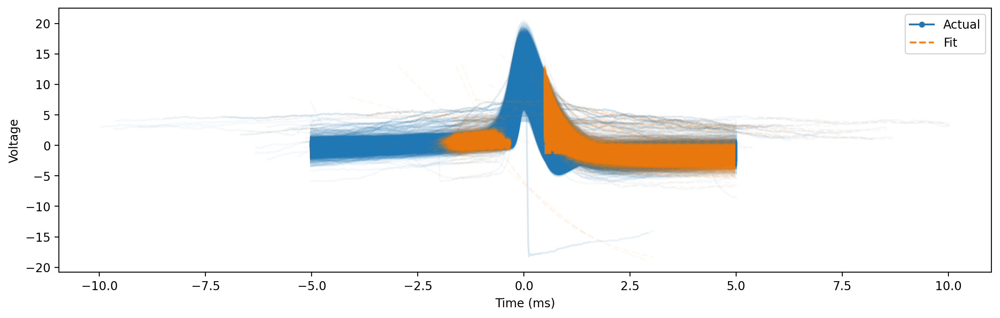

In [11]:
sp.plot()

### Filter spikes 

In [12]:
sp.filter_features()  

### Get spike dataframe (with spike times column)

In [13]:

df_features = sp.df_features

#add columns for spike times, both in idx and ms
df_features['spk_times_idx'] = sp.spike_inds
df_features['spk_times_ms'] = patch_times[sp.spike_inds]
df_features['spk_id'] = range(len(df_features))

In [14]:
df_features

,ramp_amp,inflection_time,inflection_amp,peak_amp,peak_width,peak_sharpness,exp_lambda,exp_const,log_isi,spk_times_idx,spk_times_ms,spk_id
0,0.030786,0.28,0.200051,7.895348,0.30,2.490041,0.000026,-0.880492,1.824179,53650,1.072487e+03,0
1,0.185567,0.26,0.442928,7.949770,0.30,2.641294,0.000002,-0.294561,1.631439,56987,1.139196e+03,1
2,0.877363,0.26,0.629470,7.800408,0.32,2.410221,0.000010,-0.435603,1.717796,59128,1.181995e+03,2
3,-0.052398,0.28,0.314866,7.699788,0.30,2.396309,0.000004,-0.445957,1.440387,61740,1.234210e+03,3
4,0.087457,0.28,0.582596,8.028814,0.32,2.347654,0.000003,-0.362595,1.215166,63119,1.261777e+03,4
...,...,...,...,...,...,...,...,...,...,...,...,...
12556,0.075823,0.38,0.147030,6.220482,0.40,1.113120,0.000015,-1.071736,1.615953,53934028,1.078165e+06,12549
12557,-0.070153,0.36,0.126203,6.108001,0.42,0.976829,0.000012,-0.968436,1.674837,53936094,1.078207e+06,12550
12558,0.116481,0.36,0.503001,6.513055,0.40,0.944731,0.000010,-0.534537,1.667992,53938460,1.078254e+06,12551
12559,0.036199,0.38,0.324115,6.458305,0.42,0.761761,0.000003,-0.770707,1.598364,53940789,1.078300e+06,12552


### Get spike times


In [15]:
spk_times_idx = df_features['spk_times_idx']
spk_times_ms = df_features['spk_times_ms']
spk_ids = df_features['spk_id']

In [16]:
df_features.columns

Index(['ramp_amp', 'inflection_time', 'inflection_amp', 'peak_amp',
       'peak_width', 'peak_sharpness', 'exp_lambda', 'exp_const', 'log_isi',
       'spk_times_idx', 'spk_times_ms', 'spk_id'],
      dtype='str')

## STEP 2: Cluster spike groups 

#### Plot distribution of all features

Plotting spike features...
Removing outliers using IQR method (multiplier=3)


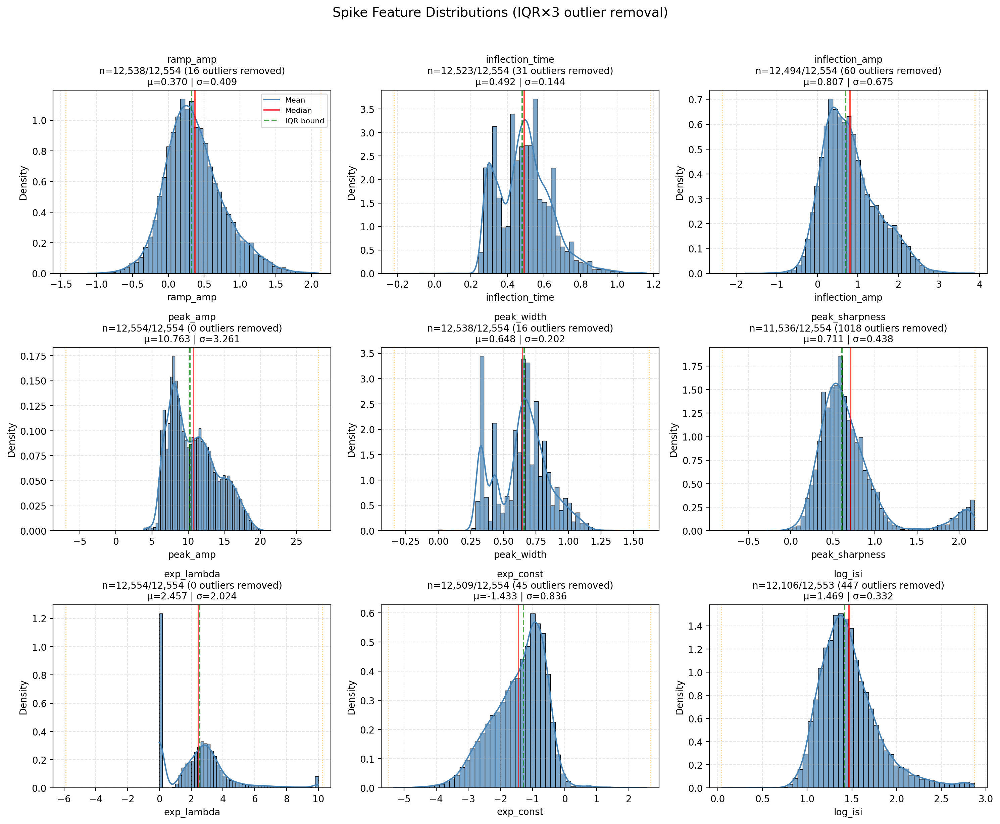


FEATURE DISTRIBUTION SUMMARY
Feature              Total N    Clean N    Outliers   % Removed  Mean       Std       
------------------------------------------------------------------------------------------
ramp_amp             12554      12538      16         0.1        0.370      0.409     
inflection_time      12554      12523      31         0.2        0.492      0.144     
inflection_amp       12554      12494      60         0.5        0.807      0.675     
peak_amp             12554      12554      0          0.0        10.763     3.261     
peak_width           12554      12538      16         0.1        0.648      0.202     
peak_sharpness       12554      11536      1018       8.1        0.711      0.438     
exp_lambda           12554      12554      0          0.0        2.457      2.024     
exp_const            12554      12509      45         0.4        -1.433     0.836     
log_isi              12553      12106      447        3.6        1.469      0.332     


In [17]:
plot_spike_feature_distributions(df_features)

In [18]:
cluster_pickle = os.path.join(SPE1_PICKLE_ROOT, 'cluster_pickles', f'c{cell_num}_cluster_df.pkl')

if FORCE_CLUSTER or not os.path.exists(cluster_pickle):
    # scan all numeric features and only cluster the ones that look multimodal
    df_features_clust, rep = cluster_multimodal_features(
        df_features.drop(["spk_times_idx"], axis = 1),
        max_k=3,
        suffix="_cluster",
        plot_each=True,  # set True if you want a quick plot per clustered feature, 
        manual_thresholds={'peak_amp':(9,14), 'peak_sharpness':1.5, 'peak_width':(0.35, 0.5)
        }
    )
    
    with open(cluster_pickle, 'wb') as f:
        pickle.dump(df_features_clust, f)
    print(f"  Saved: {os.path.basename(cluster_pickle)}")
else:
    print(f"  [cache] {os.path.basename(cluster_pickle)}")
    with open(cluster_pickle, 'rb') as f:
        df_features_clust = pickle.load(f)


  [cache] c21_cluster_df.pkl



===== CLUSTER REPORT: peak_amp_cluster =====
Found 3 clusters: ['high', 'low', 'mid']

→ Determining cluster colors and labels...
  Using existing cluster labels: ['high', 'low', 'mid']
  Groups: ('low', 'mid', 'high')
  Group names: ('Low', 'Mid', 'High')

→ 1. Plotting spike waveforms by cluster


/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/spikeparam/spikeparam/patch/plts/plts.py:172: RuntimeWarning: Mean of empty slice
  avg_actual = np.nanmean(arr[:, :n], axis=0)
/Users/blancamartin/opt/anaconda3/envs/spikeparam/lib/python3.11/site-packages/numpy/lib/_nanfunctions_impl.py:1997: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


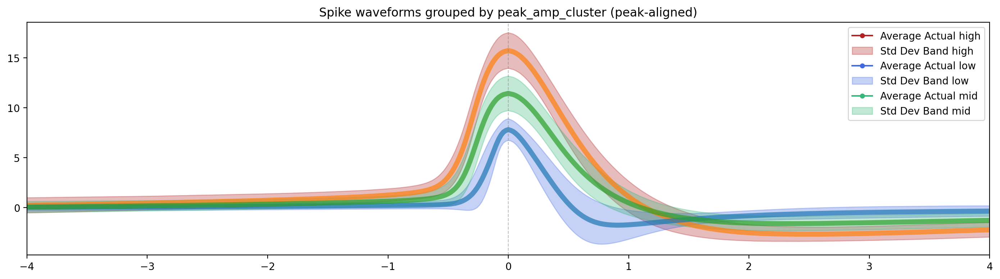


→ 1.5 Average waveforms with visual RMSE


/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/spikeparam/AP_empirical_paper1/datasets/spe-1/spe1_helper_modules/spk_feat_cluster_analysis.py:988: RuntimeWarning: Mean of empty slice
  avg_waveforms[group]    = np.nanmean(arr, axis=0)


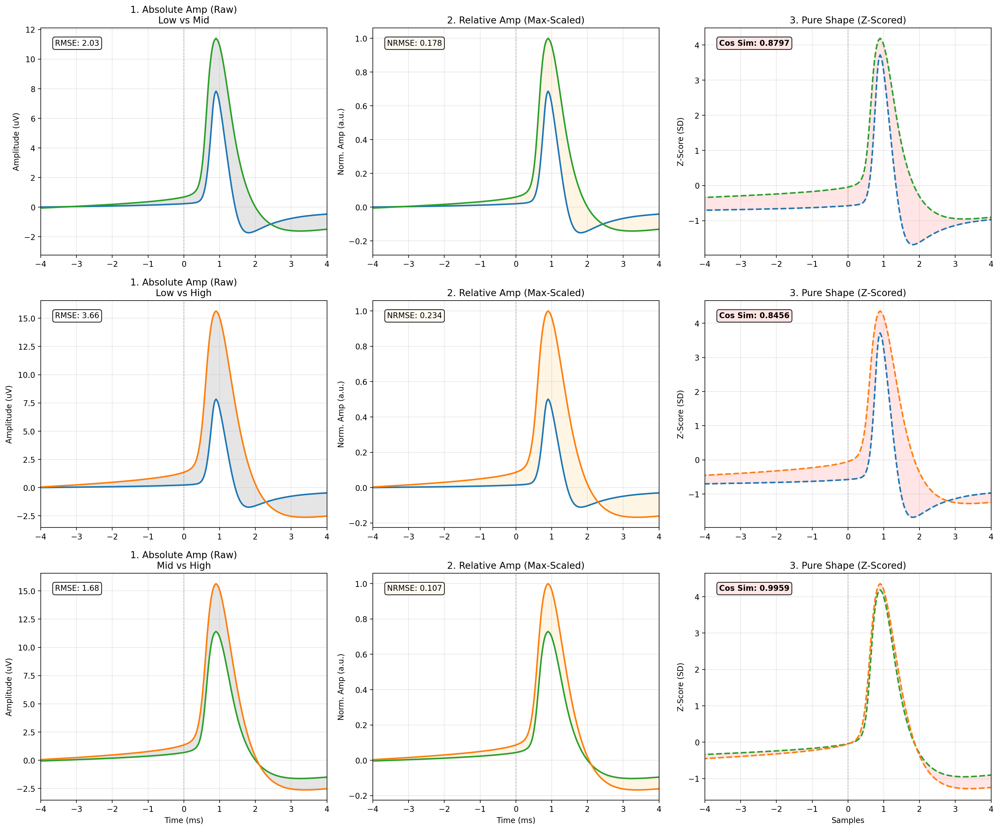


→ 2. Plotting cluster proportions over time


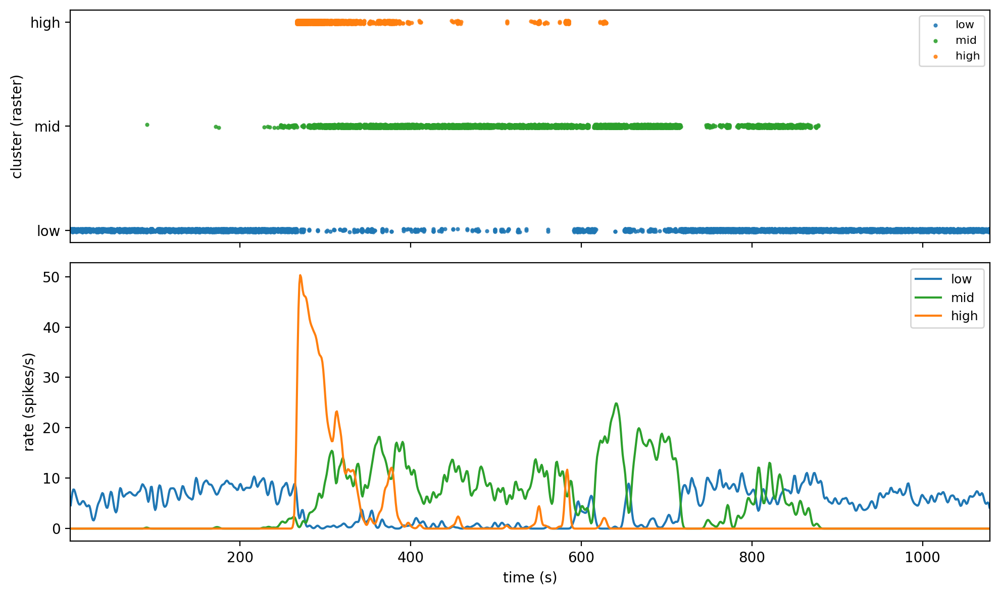


→ 3. Computing cluster transition matrix


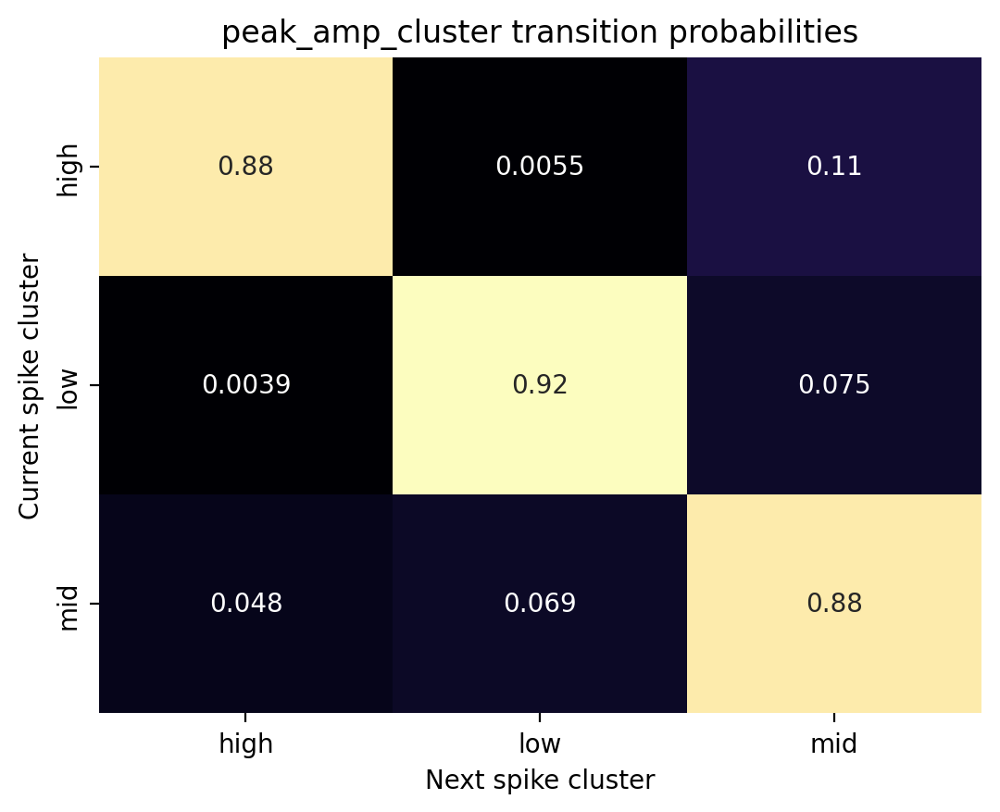


→ 4. Visualizing feature distributions by cluster


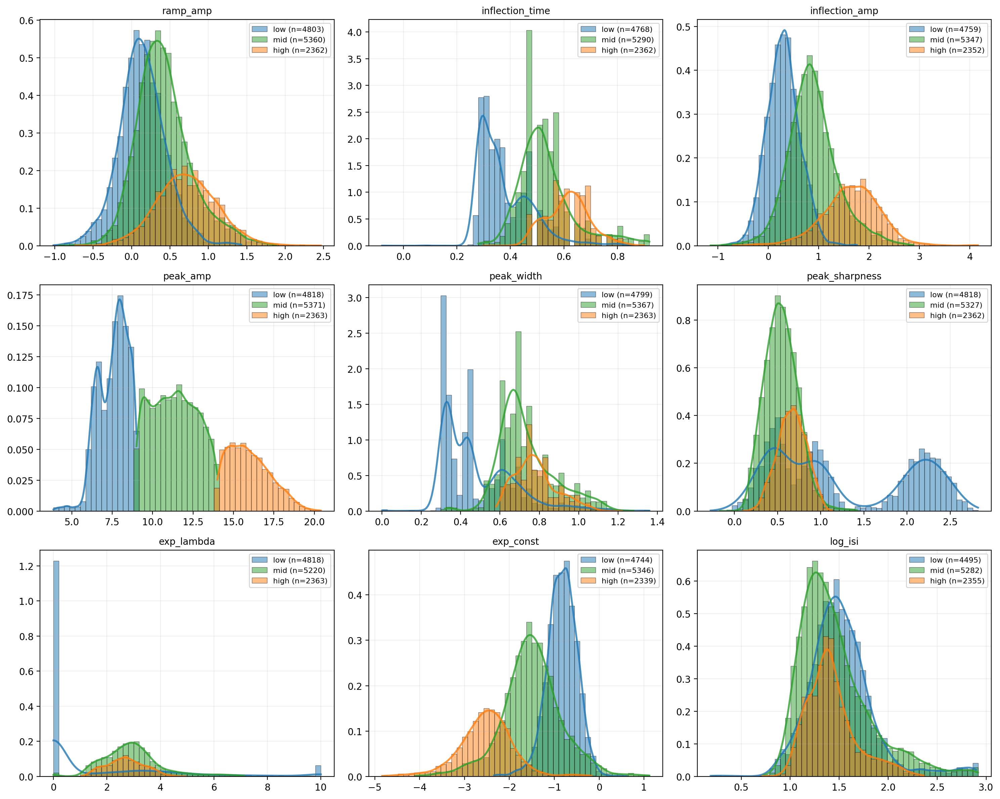


→ 5. Statistical analysis for: peak_amp
----------------------------------------

Test: Kruskal-Wallis (nonparametric)
Number of groups: 3
P-value: 0.000000
Significance: ***
η² effect size: 0.858
Interpretation: Very Large


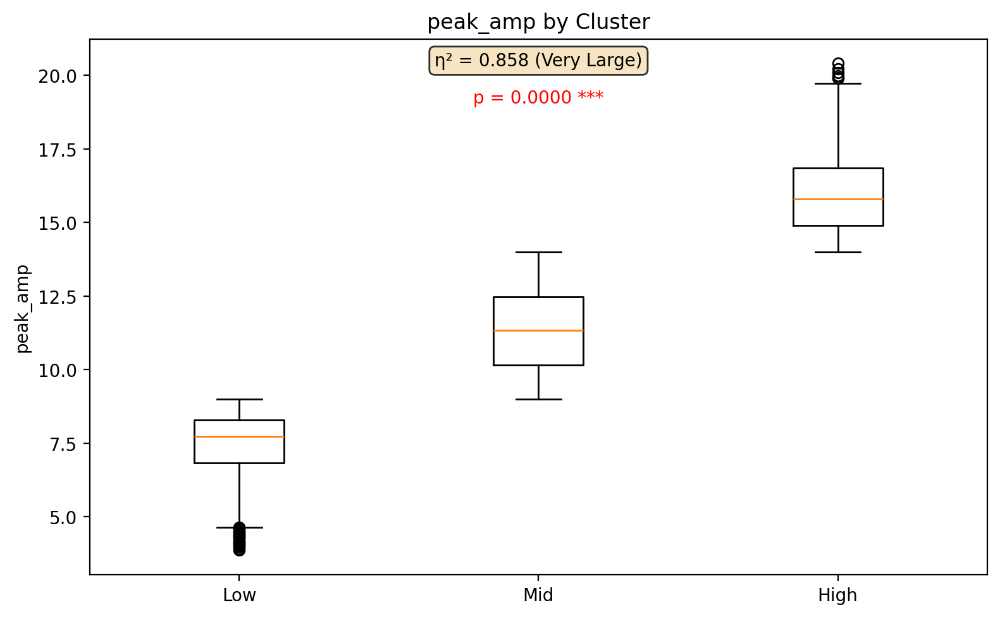


===== REPORT COMPLETE =====


===== CLUSTER REPORT: peak_width_cluster =====
Found 3 clusters: ['high', 'low', 'mid']

→ Determining cluster colors and labels...
  Using existing cluster labels: ['high', 'low', 'mid']
  Groups: ('low', 'mid', 'high')
  Group names: ('Low', 'Mid', 'High')

→ 1. Plotting spike waveforms by cluster


/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/spikeparam/spikeparam/patch/plts/plts.py:172: RuntimeWarning: Mean of empty slice
  avg_actual = np.nanmean(arr[:, :n], axis=0)
/Users/blancamartin/opt/anaconda3/envs/spikeparam/lib/python3.11/site-packages/numpy/lib/_nanfunctions_impl.py:1997: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


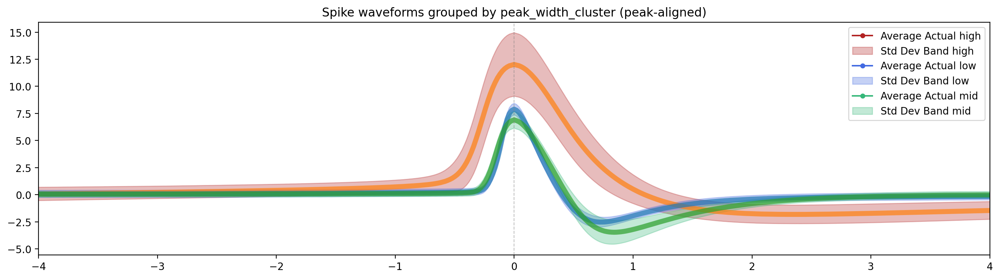


→ 1.5 Average waveforms with visual RMSE


/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/spikeparam/AP_empirical_paper1/datasets/spe-1/spe1_helper_modules/spk_feat_cluster_analysis.py:988: RuntimeWarning: Mean of empty slice
  avg_waveforms[group]    = np.nanmean(arr, axis=0)


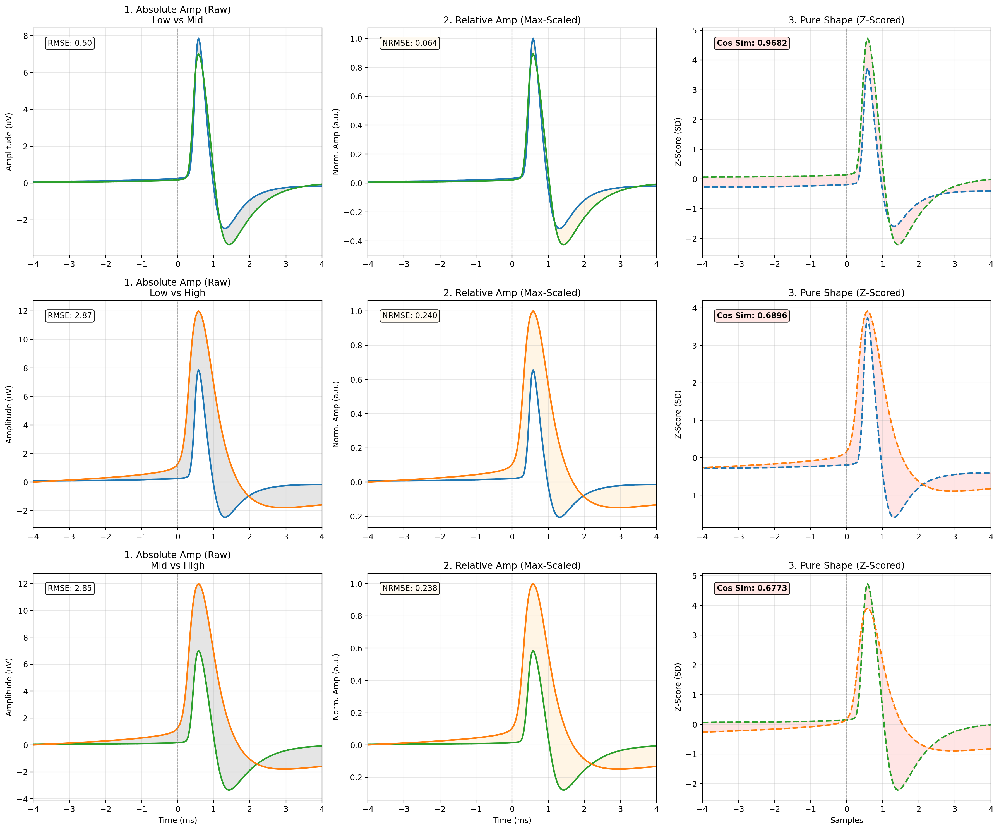


→ 2. Plotting cluster proportions over time


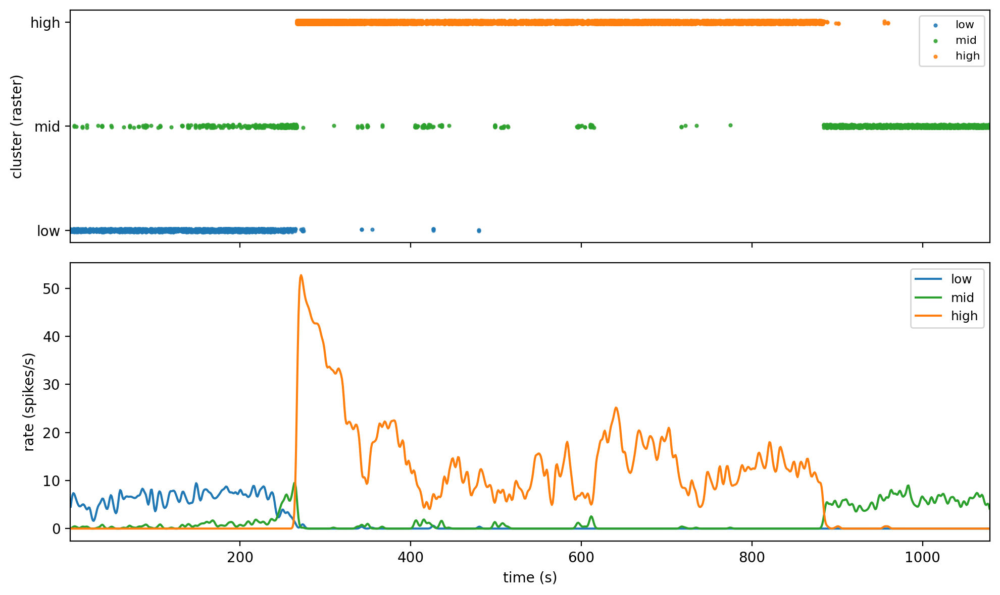


→ 3. Computing cluster transition matrix


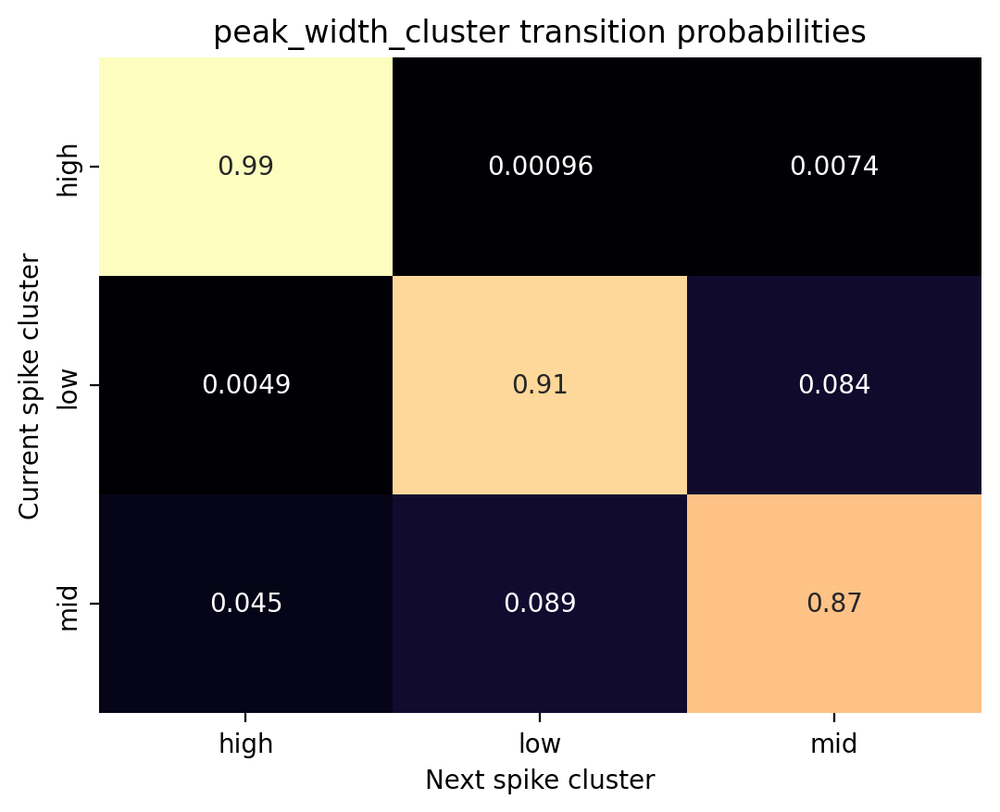


→ 4. Visualizing feature distributions by cluster


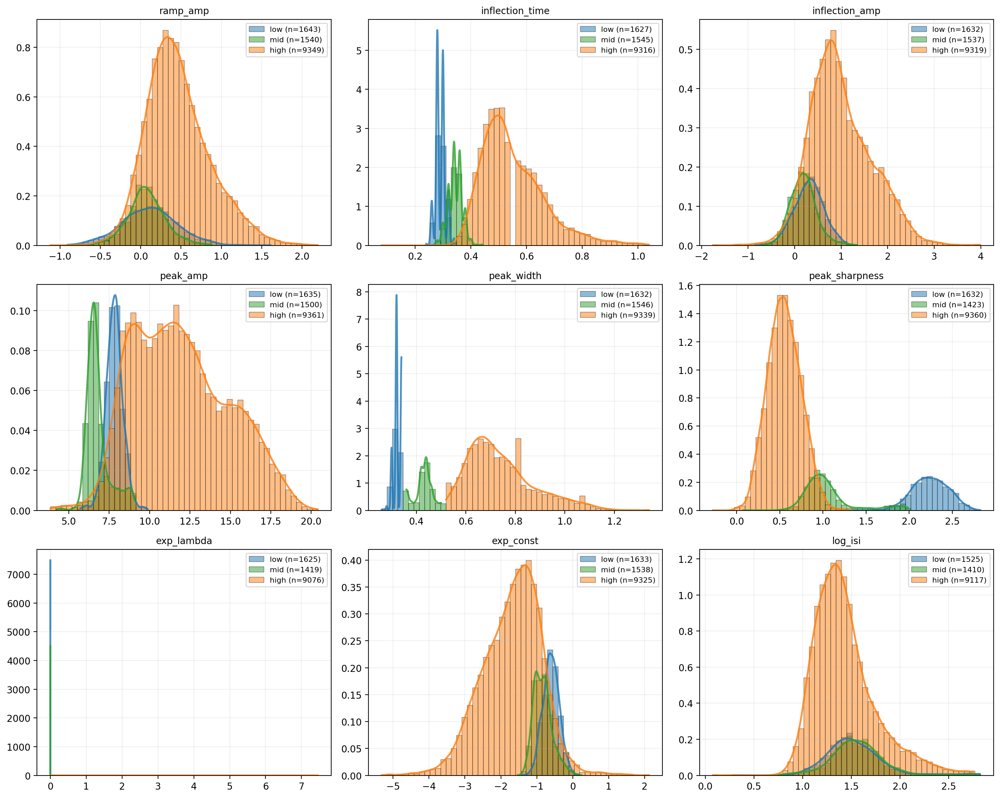


→ 5. Statistical analysis for: peak_width
----------------------------------------

Test: Kruskal-Wallis (nonparametric)
Number of groups: 3
P-value: 0.000000
Significance: ***
η² effect size: 0.582
Interpretation: Very Large


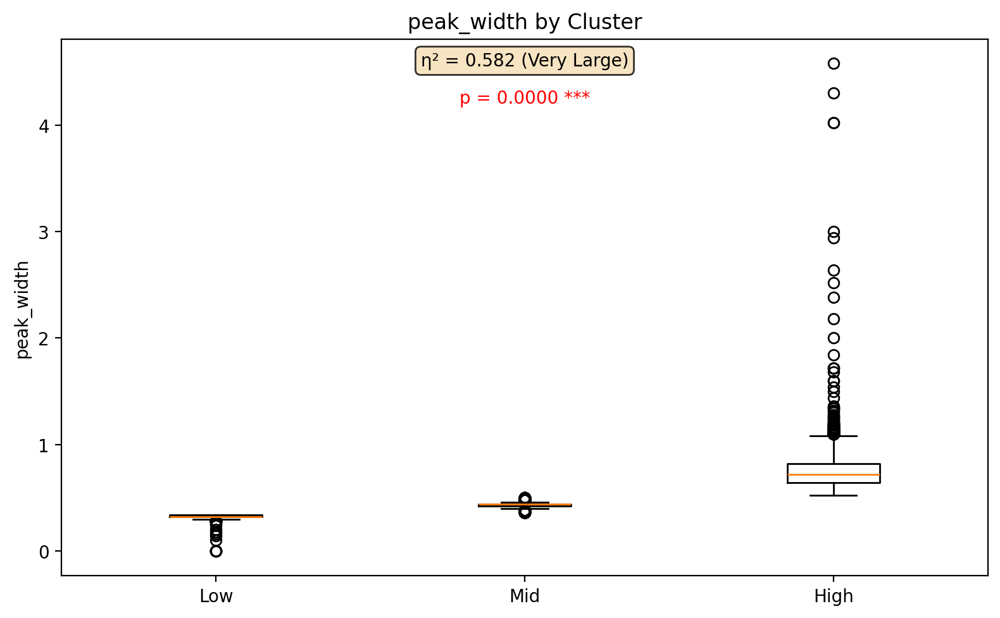


===== REPORT COMPLETE =====


===== CLUSTER REPORT: peak_sharpness_cluster =====
Found 2 clusters: ['high', 'low']

→ Determining cluster colors and labels...
  Using existing cluster labels: ['high', 'low']
  Groups: ('low', 'high')
  Group names: ('Low', 'High')

→ 1. Plotting spike waveforms by cluster


/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/spikeparam/spikeparam/patch/plts/plts.py:172: RuntimeWarning: Mean of empty slice
  avg_actual = np.nanmean(arr[:, :n], axis=0)
/Users/blancamartin/opt/anaconda3/envs/spikeparam/lib/python3.11/site-packages/numpy/lib/_nanfunctions_impl.py:1997: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


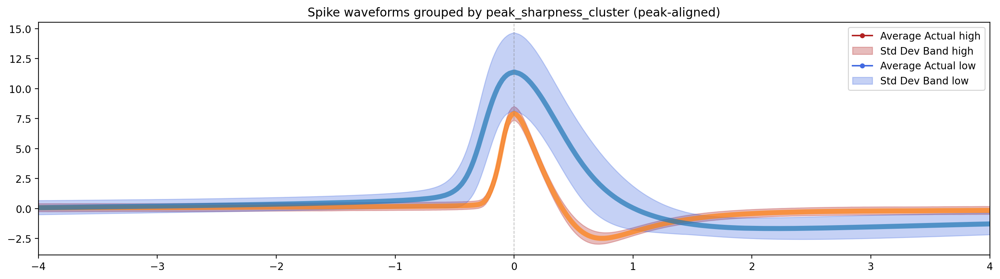


→ 1.5 Average waveforms with visual RMSE


/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/spikeparam/AP_empirical_paper1/datasets/spe-1/spe1_helper_modules/spk_feat_cluster_analysis.py:988: RuntimeWarning: Mean of empty slice
  avg_waveforms[group]    = np.nanmean(arr, axis=0)


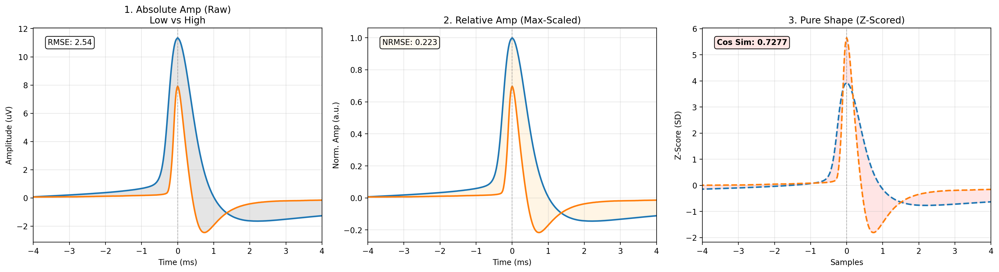


→ 2. Plotting cluster proportions over time


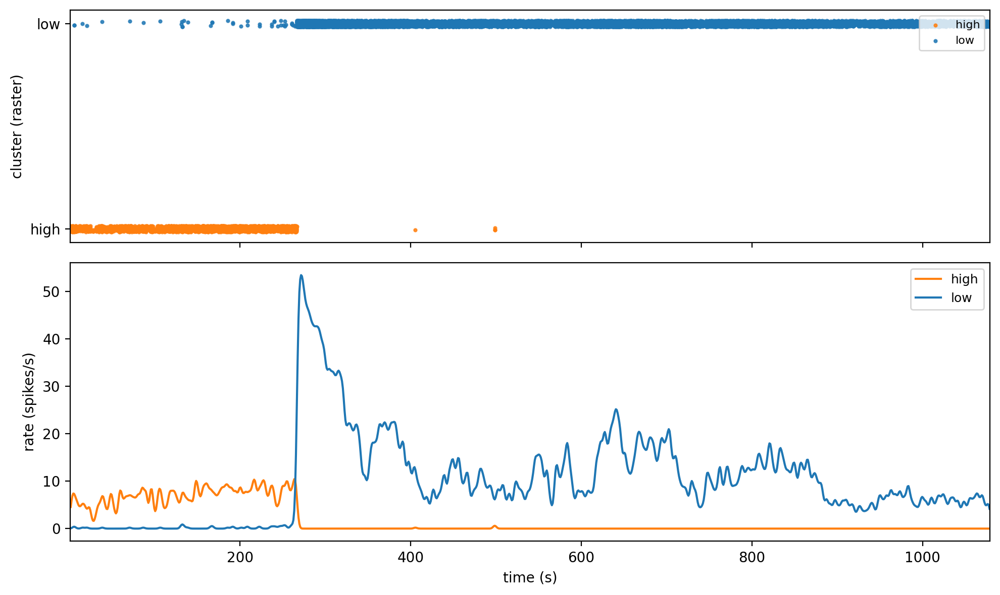


→ 3. Computing cluster transition matrix


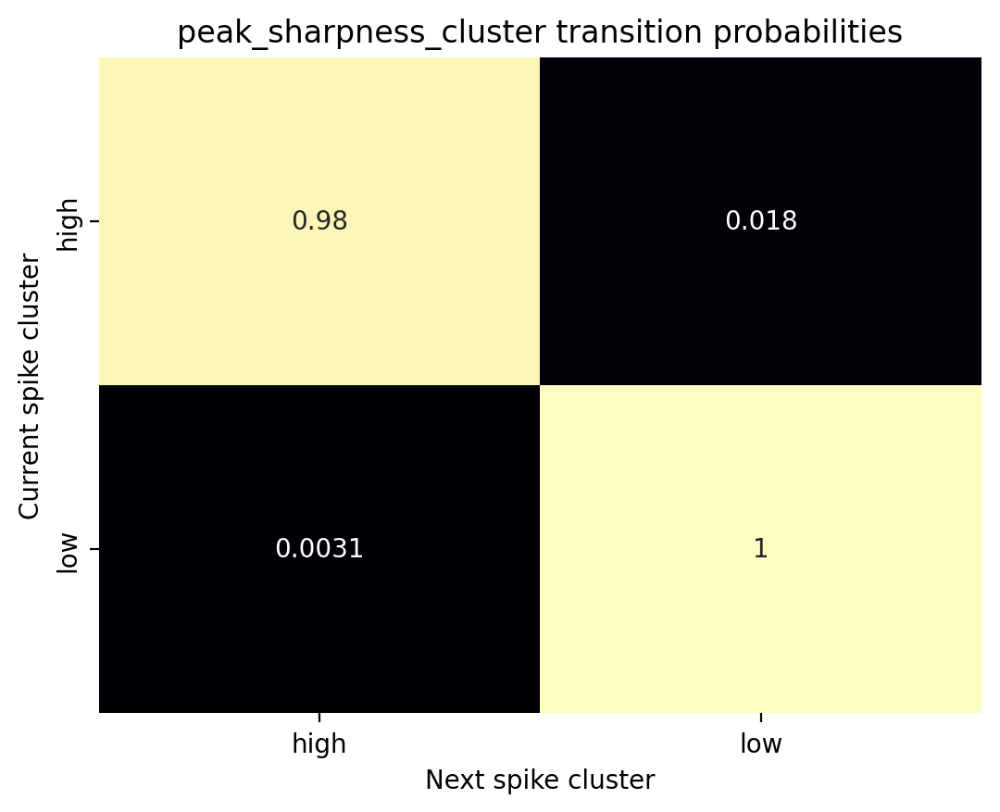


→ 4. Visualizing feature distributions by cluster


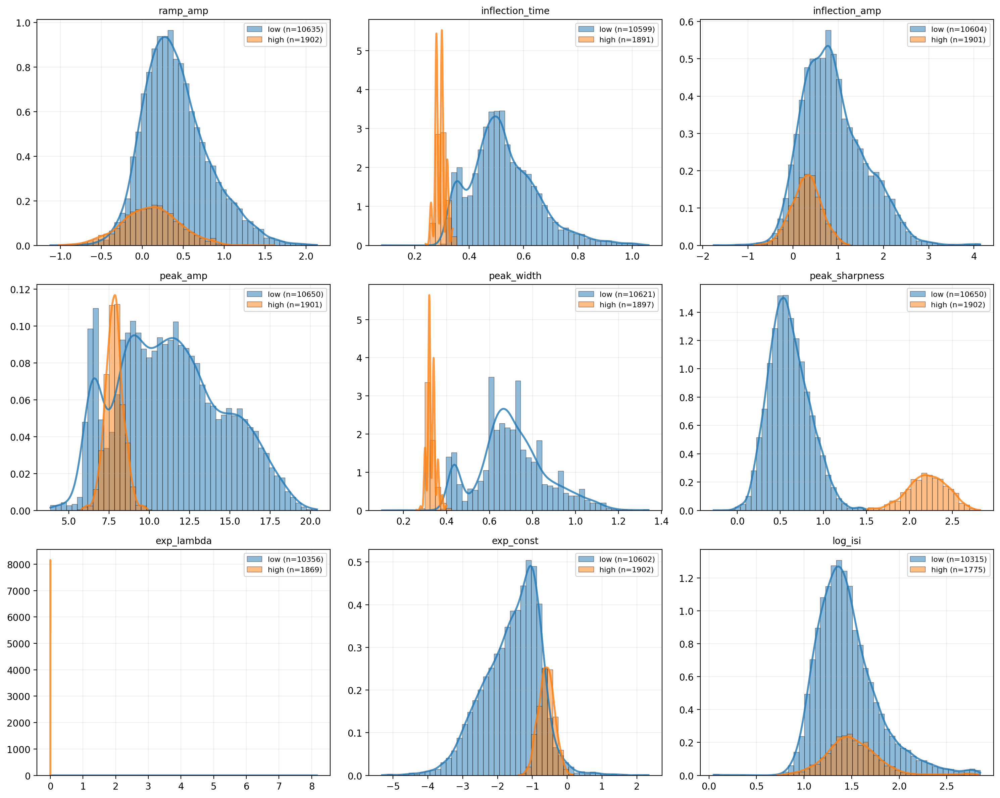


→ 5. Statistical analysis for: peak_sharpness
----------------------------------------

Test: Mann-Whitney U (nonparametric)
Number of groups: 2
P-value: 0.000000
Significance: ***
η² effect size: 0.859
Interpretation: Very Large


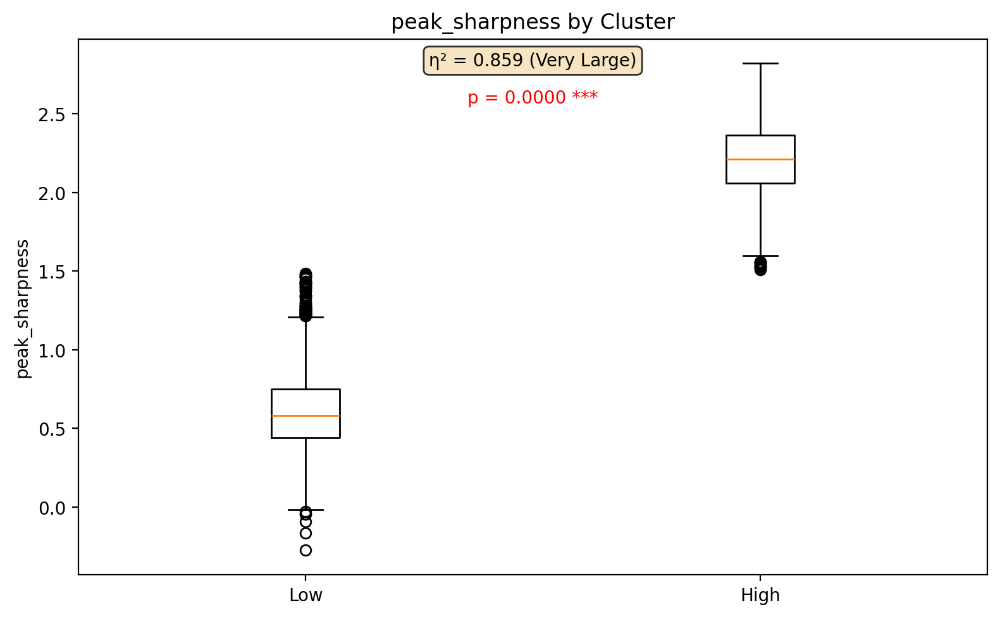


===== REPORT COMPLETE =====


===== CLUSTER REPORT: spk_times_ms_cluster =====
Found 3 clusters: ['high', 'low', 'mid']

→ Determining cluster colors and labels...
  Using existing cluster labels: ['high', 'low', 'mid']
  Groups: ('low', 'mid', 'high')
  Group names: ('Low', 'Mid', 'High')

→ 1. Plotting spike waveforms by cluster


/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/spikeparam/spikeparam/patch/plts/plts.py:172: RuntimeWarning: Mean of empty slice
  avg_actual = np.nanmean(arr[:, :n], axis=0)
/Users/blancamartin/opt/anaconda3/envs/spikeparam/lib/python3.11/site-packages/numpy/lib/_nanfunctions_impl.py:1997: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


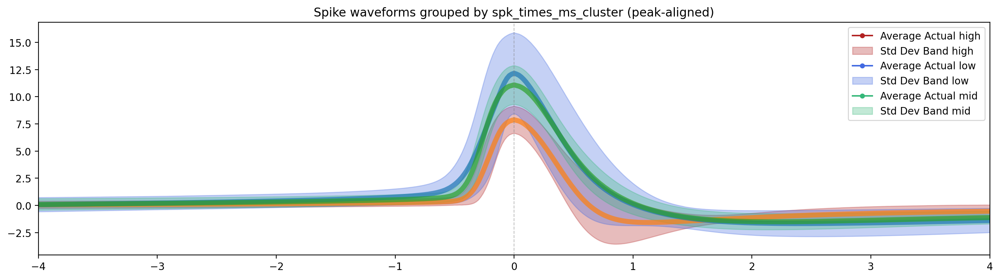


→ 1.5 Average waveforms with visual RMSE


/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/spikeparam/AP_empirical_paper1/datasets/spe-1/spe1_helper_modules/spk_feat_cluster_analysis.py:988: RuntimeWarning: Mean of empty slice
  avg_waveforms[group]    = np.nanmean(arr, axis=0)


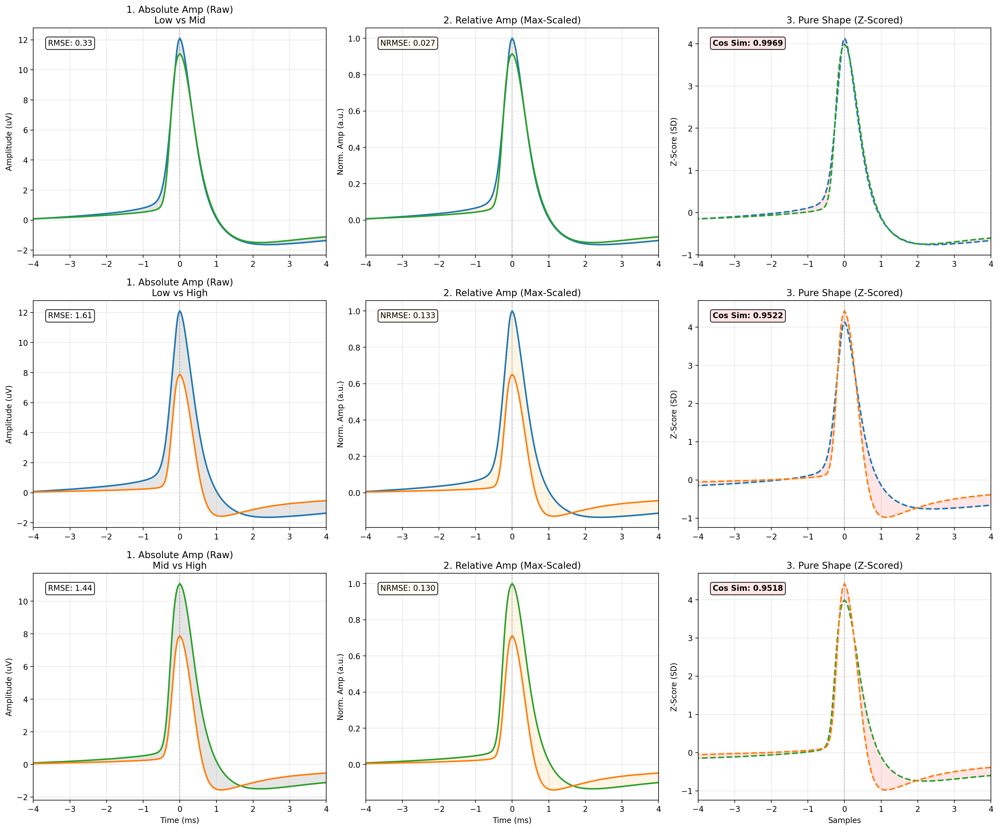


→ 2. Plotting cluster proportions over time


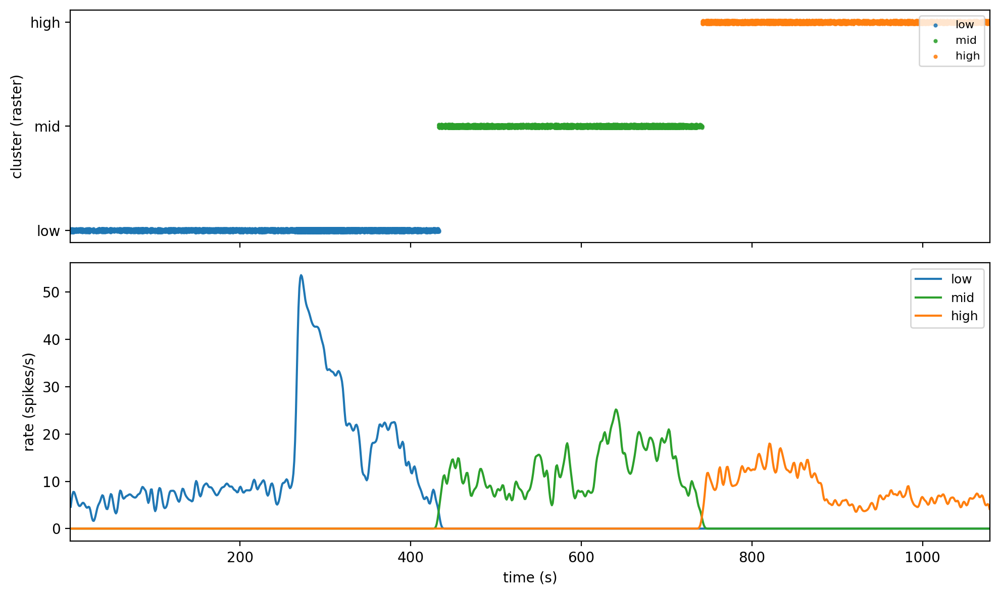


→ 3. Computing cluster transition matrix


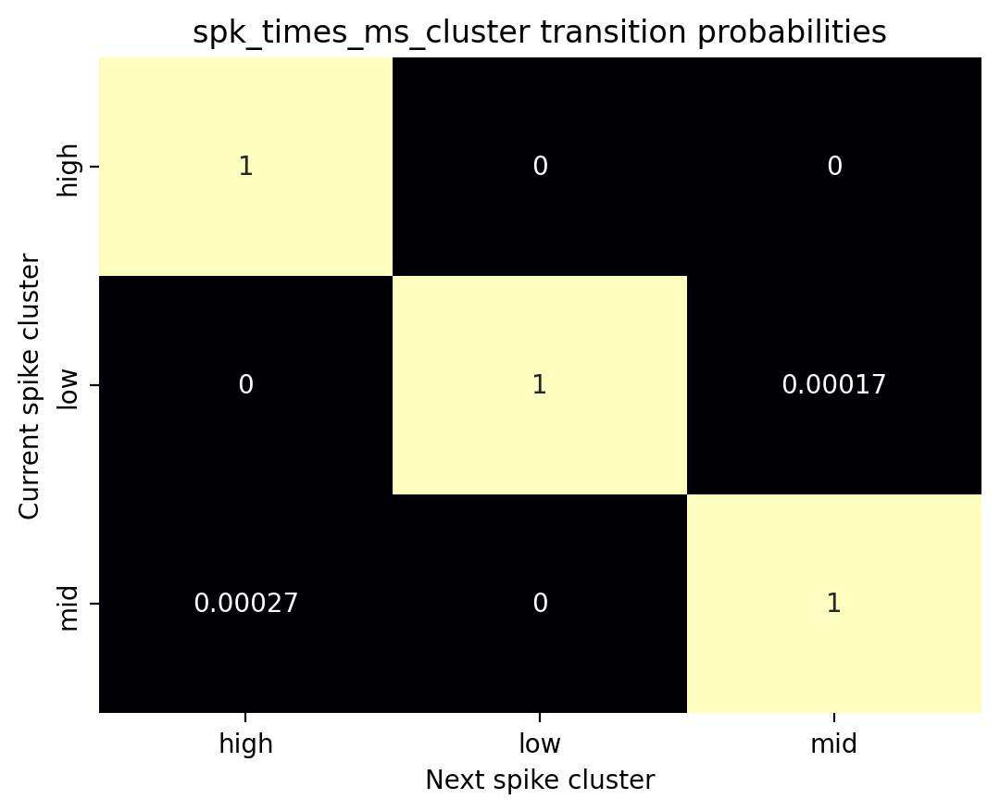


→ 4. Visualizing feature distributions by cluster


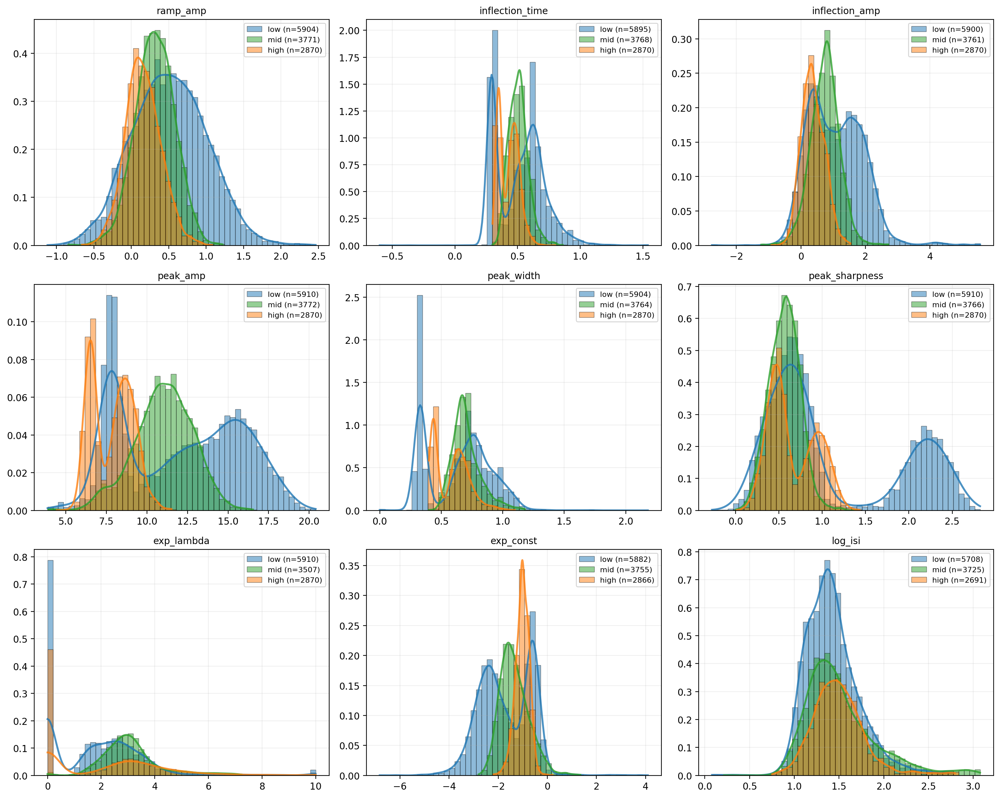


→ 5. Statistical analysis for: spk_times_ms
----------------------------------------

Test: Kruskal-Wallis (nonparametric)
Number of groups: 3
P-value: 0.000000
Significance: ***
η² effect size: 0.857
Interpretation: Very Large


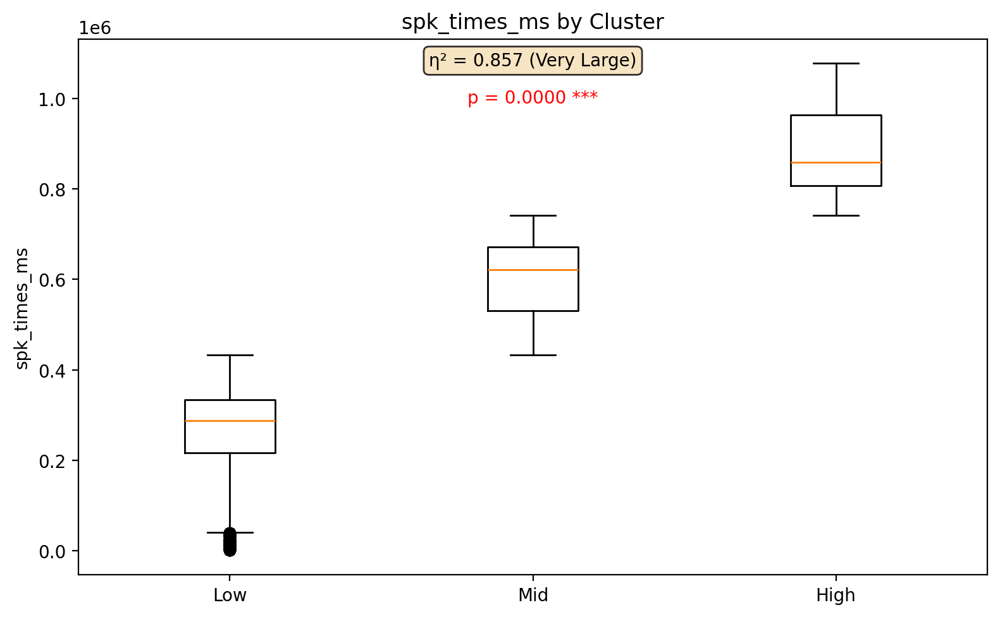


===== REPORT COMPLETE =====



In [19]:
all_reports = []

# Filter columns first to ensure the index is continuous
cluster_cols = [c for c in df_features_clust.columns if c.endswith("_cluster")]

for i, col in enumerate(cluster_cols):
    # Pass 'i' as the cluster_group_id
    row_df = plot_full_cluster_report(df_features_clust, sp, col, cluster_group_id=i)
    all_reports.append(row_df)

# Final Master DataFrame
master_report_df = pd.concat(all_reports, ignore_index=True)

In [20]:
# Save cluster quality report for population-level comparison analysis
report_pickle = os.path.join(SPE1_PICKLE_ROOT, 'cluster_pickles', f'c{cell_num}_cluster_report.pkl')
with open(report_pickle, 'wb') as f:
    pickle.dump(master_report_df, f)


In [21]:
# Compute and save peak-aligned average waveforms for each cluster group.
# Saved to a lightweight pickle used by the population comparison notebook.
wf_pickle = os.path.join(SPE1_PICKLE_ROOT, 'cluster_pickles', f'c{cell_num}_cluster_waveforms.pkl')
if FORCE_CLUSTER or not os.path.exists(wf_pickle):
    cluster_cols = [c for c in df_features_clust.columns if c.endswith('_cluster')]
    wf_data = compute_cluster_waveforms(sp, df_features_clust, cluster_cols)
    with open(wf_pickle, 'wb') as f:
        pickle.dump(wf_data, f)
    print(f"  Saved: {os.path.basename(wf_pickle)}")
else:
    print(f"  [cache] {os.path.basename(wf_pickle)}")


  [cache] c21_cluster_waveforms.pkl


#### Open all pickle chunks and reassamble 

#### Analyze by group

#### Plot avg specparam for each group for significant windows 